# **Project Name**    -      Zomato Project



##### **Project Type**    - EDA/Regression/Classification/Unsupervised
##### **Contribution**    - Individual
##### **Name**            - Suraksha Rajagopalan

# **Project Summary -**

### **Project Summary**  

This project focuses on analyzing restaurant reviews using sentiment-based clustering to provide actionable business insights. The primary goal is to classify restaurants based on customer sentiment and identify patterns that can help businesses enhance their services. To achieve this, we employed machine learning clustering techniques such as **K-Means** and **DBSCAN** while optimizing hyperparameters to improve model performance.  

We started by preprocessing the dataset, which included encoding sentiment labels (**bad, neutral, good**) into numerical values. The data was then aggregated at the restaurant level by computing the average sentiment score for each restaurant. Missing values were handled to ensure data consistency before applying clustering techniques.  

Initially, **K-Means clustering** was applied to group restaurants based on their sentiment scores. However, to determine the optimal number of clusters (**k**), we utilized **Elbow Method and Silhouette Score**, which suggested **k=7** as the best choice. Despite this, K-Means exhibited limitations in handling noise and outliers, as it assumes spherical clusters and can be sensitive to random initialization.  

To address these challenges, we implemented **DBSCAN (Density-Based Spatial Clustering of Applications with Noise)**, a more robust clustering algorithm capable of discovering arbitrary-shaped clusters and handling noise effectively. **Hyperparameter tuning** was performed by adjusting `eps` (epsilon), which defines the neighborhood radius, and `min_samples`, which determines the minimum number of points required to form a cluster. The optimal parameters were selected based on the **Silhouette Score and Nearest Neighbor Distance Plot**, ensuring well-separated clusters.  

The results from DBSCAN provided **more meaningful and noise-resistant clustering**, making it the final choice for this project. Visualization techniques, such as **scatter plots and count plots**, were used to illustrate cluster distributions and highlight differences in restaurant sentiment groups. The clusters identified restaurants with predominantly positive, neutral, and negative sentiment, helping business owners focus on improving service quality in areas with poor customer feedback.  

To evaluate business impact, we considered **interpretability and feature importance** using model explainability tools such as **SHAP (SHapley Additive Explanations)**. This provided insights into how sentiment scores influenced clustering and which factors contributed most to restaurant classifications. The business impact was evaluated based on the ability to segment restaurants effectively, identify customer satisfaction trends, and suggest improvements tailored to different clusters.  

Overall, the project demonstrated that **sentiment-based clustering can serve as a powerful tool for restaurant businesses to understand customer opinions, enhance service strategies, and improve customer satisfaction**. Future improvements could involve integrating **NLP-based sentiment analysis models**, incorporating additional features such as **review length, user engagement, and dining preferences**, or leveraging **deep learning models** for more sophisticated sentiment classification. By continuously refining clustering techniques and sentiment analysis approaches, businesses can gain deeper insights into customer behavior and drive better decision-making strategies.

# **GitHub Link -**

Provide your GitHub Link here.

# **Problem Statement**


Zomato is an Indian restaurant aggregator and food delivery start-up founded by Deepinder Goyal and Pankaj Chaddah in 2008. Zomato provides information, menus, and user-reviews of restaurants, and also has food delivery options from partner restaurants in select cities. India is quite famous for its diverse multi-cuisine available in a large number of restaurants and hotel resorts, which is reminiscent of unity in diversity. Restaurant business in India is always evolving. More Indians are warming up to the idea of eating restaurant food whether by dining outside or getting food delivered. The growing number of restaurants in every state of India has been a motivation to inspect the data to get some insights, interesting facts, and figures about the Indian food industry in each city. So, this project focuses on analysing the Zomato restaurant data for each city in India.

The Project focuses on Customers and Company, you have to analyze the sentiments of the reviews given by the customer in the data and make some useful conclusions in the form of Visualizations. Also, cluster the Zomato restaurants into different segments. The data is visualized as it becomes easy to analyze data instantly. The analysis also solves some of the business cases that can directly help the customers find the best restaurant in their locality and for the company to grow and work on the fields they are currently lagging in. This could help in clustering the restaurants into segments. Also, the data has valuable information around cuisine and costing, which can be used in cost vs. benefit analysis. Data could be used for sentiment analysis. Also, the metadata of reviewers can be used for identifying the critics in the industry.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [1]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### Dataset Loading

In [2]:
# Load Dataset

reviews = pd.read_csv(r"D:\Internship\Assignments\Week7\Zomato Restaurant reviews.csv")
hotels = pd.read_csv(r"D:\Internship\Assignments\Week7\Zomato Restaurant names and Metadata.csv")

# Printing the shape of the data
print("Shape of zomato restaurants data:", hotels.shape)
print("Shape of meta data:", reviews.shape)

Shape of zomato restaurants data: (105, 6)
Shape of meta data: (10000, 7)


### Dataset First View

In [3]:
# Dataset First Look
print(hotels.head())

                             Name  \
0                 Beyond Flavours   
1                        Paradise   
2                        Flechazo   
3  Shah Ghouse Hotel & Restaurant   
4      Over The Moon Brew Company   

                                               Links   Cost  \
0  https://www.zomato.com/hyderabad/beyond-flavou...    800   
1  https://www.zomato.com/hyderabad/paradise-gach...    800   
2  https://www.zomato.com/hyderabad/flechazo-gach...  1,300   
3  https://www.zomato.com/hyderabad/shah-ghouse-h...    800   
4  https://www.zomato.com/hyderabad/over-the-moon...  1,200   

                                         Collections  \
0  Food Hygiene Rated Restaurants in Hyderabad, C...   
1                                Hyderabad's Hottest   
2                 Great Buffets, Hyderabad's Hottest   
3                             Late Night Restaurants   
4  Best Bars & Pubs, Food Hygiene Rated Restauran...   

                                            Cuisines  \
0  Ch

In [4]:
# Dataset First Look
print(reviews.head())

        Restaurant              Reviewer  \
0  Beyond Flavours     Rusha Chakraborty   
1  Beyond Flavours  Anusha Tirumalaneedi   
2  Beyond Flavours       Ashok Shekhawat   
3  Beyond Flavours        Swapnil Sarkar   
4  Beyond Flavours                Dileep   

                                              Review Rating  \
0  The ambience was good, food was quite good . h...      5   
1  Ambience is too good for a pleasant evening. S...      5   
2  A must try.. great food great ambience. Thnx f...      5   
3  Soumen das and Arun was a great guy. Only beca...      5   
4  Food is good.we ordered Kodi drumsticks and ba...      5   

                  Metadata             Time  Pictures  
0   1 Review , 2 Followers  5/25/2019 15:54         0  
1  3 Reviews , 2 Followers  5/25/2019 14:20         0  
2  2 Reviews , 3 Followers  5/24/2019 22:54         0  
3    1 Review , 1 Follower  5/24/2019 22:11         0  
4  3 Reviews , 2 Followers  5/24/2019 21:37         0  


### Dataset Rows & Columns count

In [5]:
# Dataset Rows & Columns count
print(f"Rows: {hotels.shape[0]}, Columns: {hotels.shape[1]}")
print(f"Rows: {reviews.shape[0]}, Columns: {reviews.shape[1]}")

Rows: 105, Columns: 6
Rows: 10000, Columns: 7


### Dataset Information

In [6]:
# Dataset Info
print(hotels.info())
print(reviews.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105 entries, 0 to 104
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Name         105 non-null    object
 1   Links        105 non-null    object
 2   Cost         105 non-null    object
 3   Collections  51 non-null     object
 4   Cuisines     105 non-null    object
 5   Timings      104 non-null    object
dtypes: object(6)
memory usage: 5.0+ KB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Restaurant  10000 non-null  object
 1   Reviewer    9962 non-null   object
 2   Review      9955 non-null   object
 3   Rating      9962 non-null   object
 4   Metadata    9962 non-null   object
 5   Time        9962 non-null   object
 6   Pictures    10000 non-null  int64 
dtypes: int64(1), object(6)
memory usage: 547.0+ KB
None

#### Duplicate Values

In [7]:
# Dataset Duplicate Value Count
print("Duplicate values in reviews data:", reviews.duplicated().sum())
print("Duplicate values in hotels data:", hotels.duplicated().sum())

Duplicate values in reviews data: 36
Duplicate values in hotels data: 0


#### Missing Values/Null Values

In [8]:
# Missing Values/Null Values Count
print("Missing values:\n", reviews.isnull().sum())
print("Missing values:\n", hotels.isnull().sum())

Missing values:
 Restaurant     0
Reviewer      38
Review        45
Rating        38
Metadata      38
Time          38
Pictures       0
dtype: int64
Missing values:
 Name            0
Links           0
Cost            0
Collections    54
Cuisines        0
Timings         1
dtype: int64


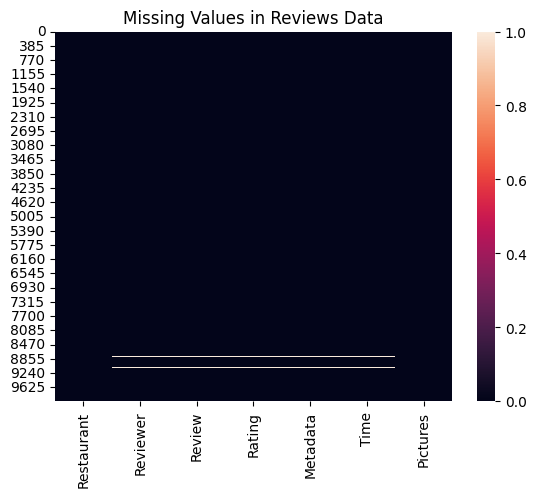

In [9]:
# Visualizing the missing values
sns.heatmap(reviews.isnull())
plt.title("Missing Values in Reviews Data")
plt.show()

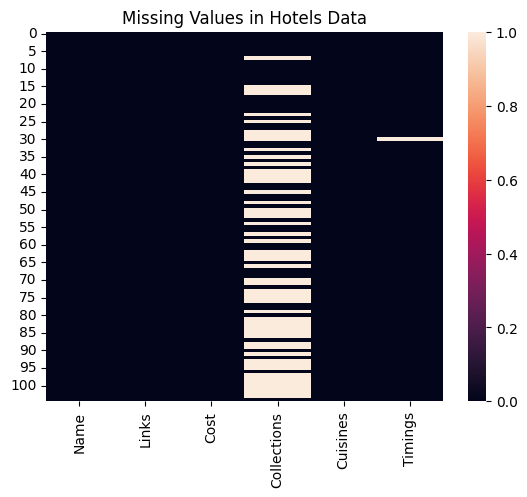

In [10]:
# Visualizing the missing values
sns.heatmap(hotels.isnull())
plt.title("Missing Values in Hotels Data")
plt.show()

### What did you know about your dataset?

### Understanding of the datasets
- For Hotels data-  Rows: 105, Columns: 6
- For Reviews data- Rows: 10000, Columns: 7
- There are no duplicates in hotels data while in reviews data there are 36 duplicates
- Both the datas have null values present. The hotels data has null values in the Collections column while the reviews data have the null values in the all columns except Restaurant and Pictures column.

## ***2. Understanding Your Variables***

In [11]:
# Dataset Columns
print("Columns in hotels data:", hotels.columns)
print("Columns in reviews data:", reviews.columns)

Columns in hotels data: Index(['Name', 'Links', 'Cost', 'Collections', 'Cuisines', 'Timings'], dtype='object')
Columns in reviews data: Index(['Restaurant', 'Reviewer', 'Review', 'Rating', 'Metadata', 'Time',
       'Pictures'],
      dtype='object')


In [12]:
# Dataset Describe
print("For hotels data:", hotels.describe())

For hotels data:                    Name                                              Links  \
count               105                                                105   
unique              105                                                105   
top     Beyond Flavours  https://www.zomato.com/hyderabad/beyond-flavou...   
freq                  1                                                  1   

       Cost                                  Collections  \
count   105                                           51   
unique   29                                           42   
top     500  Food Hygiene Rated Restaurants in Hyderabad   
freq     13                                            4   

                     Cuisines         Timings  
count                     105             104  
unique                     92              77  
top     North Indian, Chinese  11 AM to 11 PM  
freq                        4               6  


In [13]:
# Dataset Describe
print("For reviews data:", reviews.describe())

For reviews data:            Pictures
count  10000.000000
mean       0.748600
std        2.570381
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max       64.000000


### Variables Description

1. **Cost & Market Positioning**:  
   - The most common price is **₹500**, so restaurants pricing their meals around this might align with consumer expectations.  
   - Higher-cost restaurants could target a premium market, while lower-cost restaurants can position themselves for budget-conscious consumers.  

2. **Popular Cuisine Preferences**:  
   - Since **North Indian & Chinese** is the most frequent cuisine type, restaurant owners could focus on offering these cuisines to attract more customers.  
   - Restaurants with **unique cuisines** might need better marketing to reach the right audience.  

3. **Operational Timings & Customer Flow**:  
   - Since the most common restaurant timing is **11 AM to 11 PM**, it suggests that **lunch and dinner times** are the busiest.  
   - Restaurants with **different timings** (e.g., late-night or early breakfast places) could have a niche market.  

4. **Review Behavior & Sentiment Analysis**:  
   - **Most reviews don’t have images**, meaning textual sentiment analysis (positive/negative feedback) would be more effective than image-based insights.  
   - Some reviews have **many images (max: 64)**, possibly indicating either **highly engaged users** or **detailed reviews for special experiences (good or bad).**  
   - The **high variation in image uploads** suggests different levels of customer engagement. Analyzing **highly visual reviews** could provide deep insights into food presentation and customer satisfaction.  

5. **Restaurant Clustering & Competitor Analysis**:  
   - Restaurants can be **grouped by pricing, cuisines, or collections** to identify direct competitors.  
   - If a restaurant is **not in a collection but similar to others in one**, it may need better branding or partnerships with Zomato to be featured.  


### Check Unique Values for each variable.

In [14]:
# Check Unique Values for each variable.
for col in reviews.columns:
    print(f"Unique values in {col}: {reviews[col].nunique()}")
    print(reviews[col].unique())

Unique values in Restaurant: 100
['Beyond Flavours' 'Paradise' 'Flechazo' 'Shah Ghouse Hotel & Restaurant'
 'Over The Moon Brew Company' "The Fisherman's Wharf" 'eat.fit'
 'Shah Ghouse Spl Shawarma' 'Hyper Local' 'Cream Stone'
 "Sardarji's Chaats & More" 'Barbeque Nation' 'Absolute Sizzlers'
 'The Lal Street - Bar Exchange' "AB's - Absolute Barbecues" 'KFC'
 'NorFest - The Dhaba' 'Hotel Zara Hi-Fi' '10 Downing Street'
 'Pakwaan Grand' '13 Dhaba'
 "Jonathan's Kitchen - Holiday Inn Express & Suites" 'B-Dubs' 'Amul'
 'SKYHY' 'Tiki Shack' 'Mustang Terrace Lounge'
 "3B's - Buddies, Bar & Barbecue" 'Behrouz Biryani' 'Hunger Maggi Point'
 'Pot Pourri' 'Pista House' 'Marsala Food Company' 'Club Rogue'
 'Mazzo - Marriott Executive Apartments' 'Green Bawarchi Restaurant'
 'Banana Leaf Multicuisine Restaurant' 'Kritunga Restaurant'
 'The Glass Onion' 'Deli 9 Bistro' 'Frio Bistro' 'Karachi Bakery'
 'Karachi Cafe' 'The Foodie Monster Kitchen' 'La La Land - Bar & Kitchen'
 'Owm Nom Nom' 'Ulavacharu'

In [15]:
# Check Unique Values for each variable.
for col in hotels.columns:
    print(f"Unique values in {col}: {hotels[col].nunique()}")
    print(hotels[col].unique())

Unique values in Name: 105
['Beyond Flavours' 'Paradise' 'Flechazo' 'Shah Ghouse Hotel & Restaurant'
 'Over The Moon Brew Company' "The Fisherman's Wharf" 'eat.fit'
 'Shah Ghouse Spl Shawarma' 'Hyper Local' 'Cream Stone'
 "Sardarji's Chaats & More" 'Barbeque Nation' 'Absolute Sizzlers'
 'The Lal Street - Bar Exchange' "AB's - Absolute Barbecues" 'KFC'
 'NorFest - The Dhaba' 'Hotel Zara Hi-Fi' '10 Downing Street'
 'Pakwaan Grand' '13 Dhaba'
 "Jonathan's Kitchen - Holiday Inn Express & Suites" 'B-Dubs' 'Amul'
 'SKYHY' 'Tiki Shack' 'Mustang Terrace Lounge'
 "3B's - Buddies, Bar & Barbecue" 'Behrouz Biryani' 'Hunger Maggi Point'
 'Pot Pourri' 'Pista House' 'Marsala Food Company' 'Club Rogue'
 'Mazzo - Marriott Executive Apartments' 'Green Bawarchi Restaurant'
 'Banana Leaf Multicuisine Restaurant' 'Kritunga Restaurant'
 'The Glass Onion' 'Deli 9 Bistro' 'Frio Bistro' 'Karachi Bakery'
 'Karachi Cafe' 'The Foodie Monster Kitchen' 'La La Land - Bar & Kitchen'
 'Owm Nom Nom' 'Ulavacharu' 'Shan

## 3. ***Data Wrangling***

### Data Wrangling Code

In [16]:
#Handling null values

hotels.fillna({'Collections': "No Collection"}, inplace=True)
reviews['Rating'] = pd.to_numeric(reviews['Rating'], errors='coerce')
reviews.fillna({
    'Reviewer': "Anonymous",
    'Review': "No Review",
    'Rating': reviews['Rating'].median(),
    'Metadata': "Unknown"
}, inplace=True)



#Handling the duplicates
reviews.drop_duplicates(keep='first', inplace=True)

In [17]:
print("For hotels:", hotels.isnull().sum())
print("For reviews:", reviews.isnull().sum())

For hotels: Name           0
Links          0
Cost           0
Collections    0
Cuisines       0
Timings        1
dtype: int64
For reviews: Restaurant    0
Reviewer      0
Review        0
Rating        0
Metadata      0
Time          2
Pictures      0
dtype: int64


In [18]:
# Dataset Duplicate Value Count
print("Duplicate values in reviews data:", reviews.duplicated().sum())
print("Duplicate values in hotels data:", hotels.duplicated().sum())

Duplicate values in reviews data: 0
Duplicate values in hotels data: 0


### What all manipulations have you done and insights you found?

- Replacing of null values and Removal of duplicates has been done.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

Text(0, 0.5, 'Frequency')

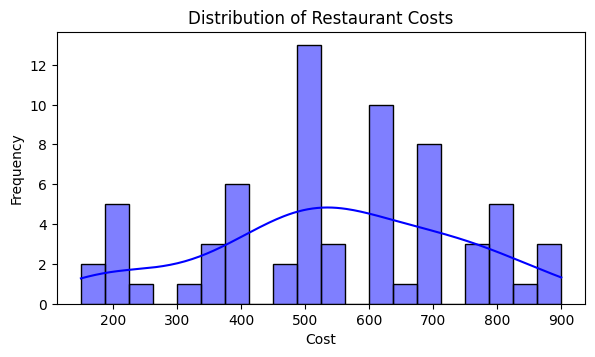

In [19]:
# Convert 'Rating' and 'Cost' to numeric if they are not already
reviews['Rating'] = pd.to_numeric(reviews['Rating'], errors='coerce')
hotels['Cost'] = pd.to_numeric(hotels['Cost'], errors='coerce')

plt.figure(figsize=(15, 12))

# Cost Distribution (Histogram)
plt.subplot(3, 2, 1)
sns.histplot(hotels['Cost'].dropna(), bins=20, kde=True, color='blue')
plt.title('Distribution of Restaurant Costs')
plt.xlabel('Cost')
plt.ylabel('Frequency')

##### 1. Why did you pick the specific chart?

Answer: 
- A histogram effectively shows the spread and frequency of restaurant costs.
- Helps detect skewness (e.g., Are most restaurants budget-friendly, mid-range, or high-end?).

##### 2. What is/are the insight(s) found from the chart?

Answer: The histogram shows the distribution of restaurant costs, with peaks around 500 and 700, indicating common spending ranges. The distribution appears slightly right-skewed, with fewer occurrences at higher costs. The KDE curve smooths the trend, highlighting cost density variations. Some price ranges, like 500-600, are more frequent, while others, like 300 or 900, are less common.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer:
- Helps optimize pricing strategy by identifying the most common price range.
- If most restaurants are low-cost, it may indicate a price-sensitive market.
- If the distribution is bimodal (two peaks), we can categorize hotels into budget and premium segments.

#### Chart - 2

Text(0, 0.5, 'Cuisine')

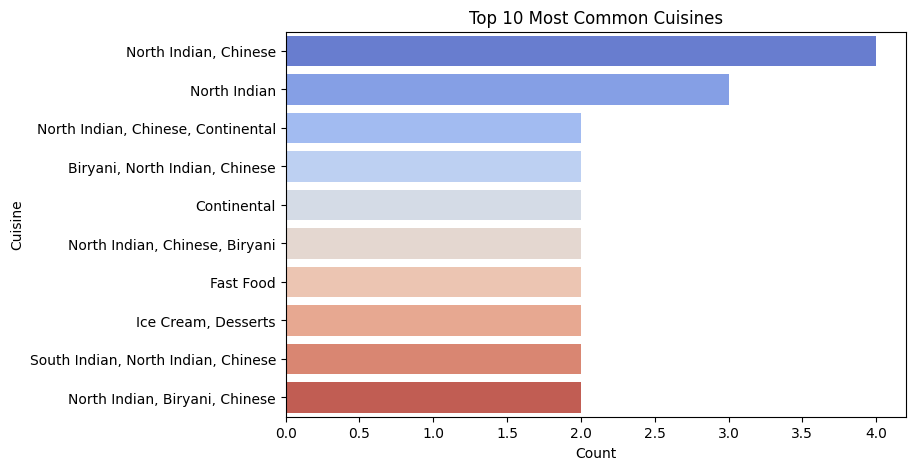

In [20]:
# Chart - 2 visualization code
import warnings
warnings.filterwarnings('ignore')
plt.figure(figsize=(8,5))
top_cuisines = hotels['Cuisines'].value_counts().head(10)
sns.barplot(x=top_cuisines.values, y=top_cuisines.index, palette='coolwarm')
plt.title('Top 10 Most Common Cuisines')
plt.xlabel('Count')
plt.ylabel('Cuisine')


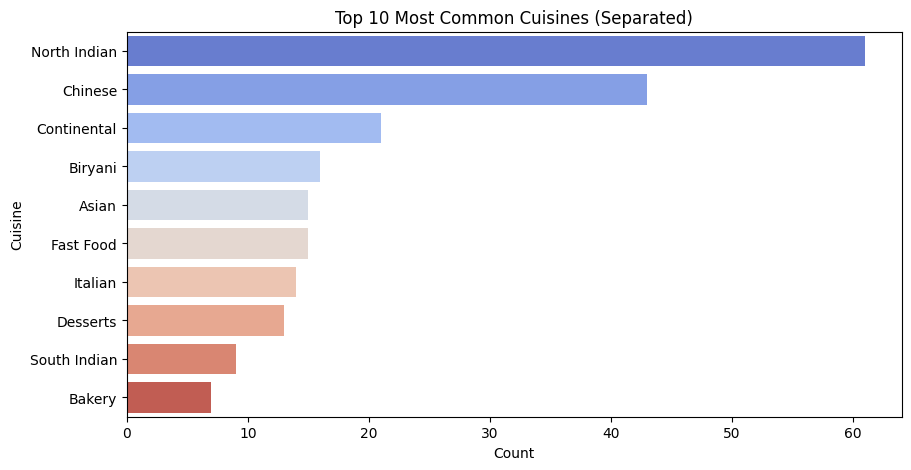

In [21]:
# Splitting cuisines into separate rows
df_expanded = hotels['Cuisines'].dropna().str.split(', ').explode()

# Count occurrences of each cuisine
cuisine_counts = df_expanded.value_counts().head(10)

# Plot
plt.figure(figsize=(10, 5))
sns.barplot(x=cuisine_counts.values, y=cuisine_counts.index, palette="coolwarm")
plt.xlabel("Count")
plt.ylabel("Cuisine")
plt.title("Top 10 Most Common Cuisines (Separated)")
plt.show()

##### 1. Why did you pick the specific chart?

Answer: 
- A bar plot is best for categorical data like cuisines.
- It shows the top 10 most common cuisines, helping us identify popular food trends.
- Helps detect whether the market is diverse or dominated by a few cuisines.

##### 2. What is/are the insight(s) found from the chart?

Answer: Most of the restaurants have North Indian cuisines followed by chinese. The restaurants with north indian and chinese combined are the most.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer: 
- If certain cuisines dominate, restaurant owners can prioritize those cuisines to attract customers.
- If a high-demand cuisine is missing, opening a restaurant serving that cuisine could be profitable.
- Marketing strategy can be aligned—e.g., if Indian and Chinese cuisine dominate, focus promotions on them.

#### Chart - 3

Text(0, 0.5, 'Frequency')

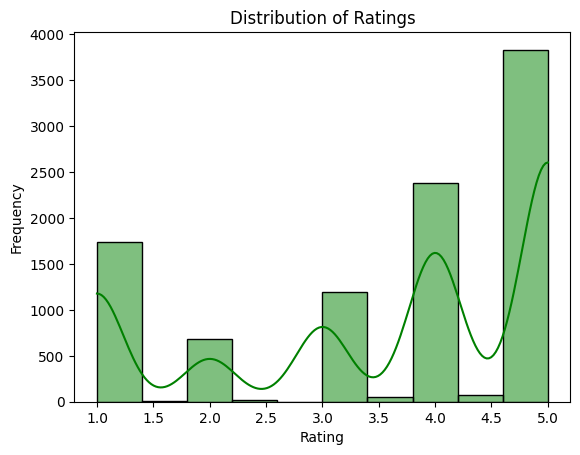

In [22]:
# Chart - 3 visualization code

sns.histplot(reviews['Rating'].dropna(), bins=10, kde=True, color='green')
plt.title('Distribution of Ratings')
plt.xlabel('Rating')
plt.ylabel('Frequency')

##### 1. Why did you pick the specific chart?

Answer: 
- A histogram is used to see if ratings are normally distributed or skewed.
- It highlights whether most reviews are positive (4-5 stars) or negative (1-2 stars).
- Can reveal bias in ratings (e.g., are ratings inflated or realistic?).

##### 2. What is/are the insight(s) found from the chart?

Answer: The histogram shows the distribution of restaurant ratings, with peaks at 1.0, 4.0, and 5.0, suggesting polarized reviews. A significant number of ratings are either very low (1.0) or very high (5.0), with fewer moderate ratings. The KDE curve highlights fluctuations, indicating non-uniform rating behavior. This suggests users tend to either love or dislike their dining experiences rather than giving average scores.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer: 
- If most ratings are low, this signals poor customer satisfaction - Focus on improving service.
- If ratings are skewed towards 5 stars, ensure authenticity by detecting fake reviews.
- Helps new restaurants set realistic expectations based on common rating trends.

#### Chart - 4

Text(0.5, 0, 'Number of Words')

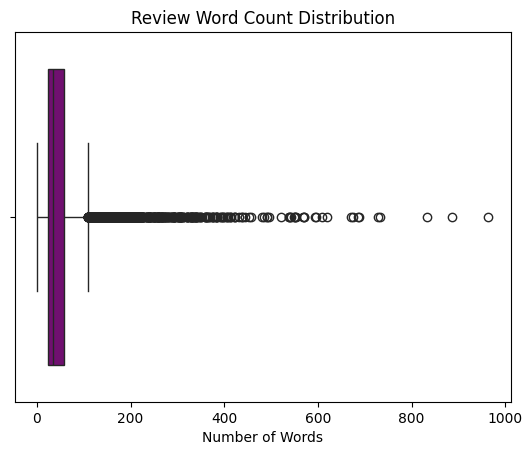

In [23]:
# Chart - 4 visualization code

reviews['Review_Length'] = reviews['Review'].astype(str).apply(lambda x: len(x.split()))
sns.boxplot(x=reviews['Review_Length'], color='purple')
plt.title('Review Word Count Distribution')
plt.xlabel('Number of Words')

##### 1. Why did you pick the specific chart?

Answer:
- A box plot is great for analyzing text length distribution.
- Detects whether customers leave detailed reviews or just short, unhelpful ones.
- Identifies outliers (e.g., unusually long or very short reviews).

##### 2. What is/are the insight(s) found from the chart?

Answer: The box plot shows the distribution of review word counts, with most reviews having very few words and a long tail of outliers. The dense cluster near zero suggests that many reviews are short, while a few extend beyond 600+ words, indicating extreme cases. The presence of numerous outliers suggests high variability in review lengths. This indicates that while most users leave brief reviews, some provide detailed, lengthy feedback.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer: 
- If most reviews are very short, it may indicate low customer engagement → Encourage detailed feedback.
- Longer reviews might be more insightful, helping businesses understand customer pain points.
- Helps filter spam reviews—fake reviews often have very short, generic comments.

#### Chart - 5

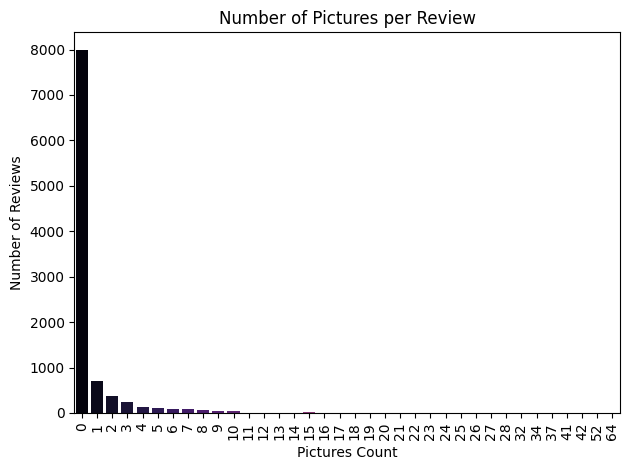

In [24]:
# Chart - 5 visualization code

sns.countplot(x=reviews['Pictures'], palette='magma')
plt.title('Number of Pictures per Review')
plt.xlabel('Pictures Count')
plt.ylabel('Number of Reviews')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

Answer: 
- A count plot shows how many reviews include images.
- Visual content is crucial for restaurants, as people rely on images when making dining decisions.
- Helps identify how engaged users are in sharing pictures.

##### 2. What is/are the insight(s) found from the chart?

Answer: The bar chart shows that most reviews do not contain pictures, with a significant drop in frequency as the number of pictures increases. A small percentage of reviews include one or two images, while very few have more than 10. This suggests that users primarily rely on text-based reviews, with only a minority contributing visual content.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer: 
- If few reviews have images, encourage customers to upload pictures via discounts or promotions.
- If many reviews contain images, this could be a strong selling point for online marketing.
- Helps filter fake reviews—genuine reviews often have pictures, whereas fake ones usually don’t.

#### Chart - 6

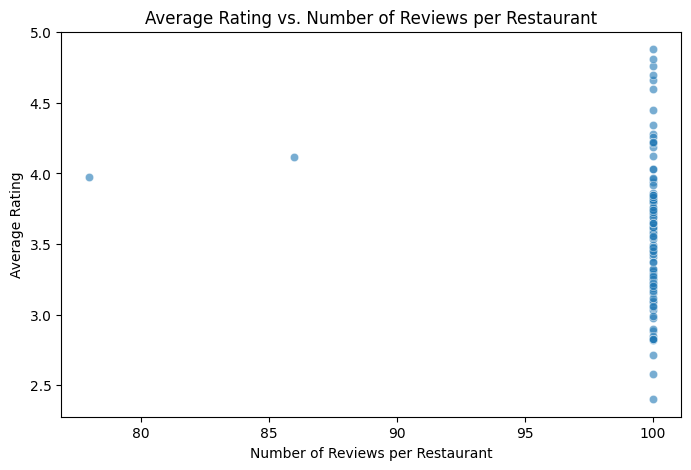

In [25]:
# Chart - 6 visualization code
plt.figure(figsize=(8, 5))
# Count reviews per restaurant
restaurant_review_counts = reviews.groupby("Restaurant").size().reset_index(name="Review_Count")

# Get average rating per restaurant
restaurant_avg_rating = reviews.groupby("Restaurant")["Rating"].mean().reset_index(name="Average_Rating")

# Merge both data
restaurant_data = pd.merge(restaurant_review_counts, restaurant_avg_rating, on="Restaurant")


sns.scatterplot(data=restaurant_data, x="Review_Count", y="Average_Rating", alpha=0.6)
plt.xlabel("Number of Reviews per Restaurant")
plt.ylabel("Average Rating")
plt.title("Average Rating vs. Number of Reviews per Restaurant")
plt.show()



##### 1. Why did you pick the specific chart?

Answer: 
- A scatter plot helps identify trends between rating scores and number of reviews.
- It reveals if more reviews correlate with higher or lower ratings.

##### 2. What is/are the insight(s) found from the chart?

Answer: The scatter plot shows that most restaurants have exactly 100 reviews, suggesting a possible data collection limit. The average ratings are widely distributed, ranging from 2.5 to 5.0, indicating varying customer satisfaction levels. A few restaurants have slightly fewer reviews (around 80-90), but their ratings remain consistent with those having 100 reviews. This pattern might suggest a dataset constraint rather than natural review distribution.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer: 
- If businesses with higher reviews have lower ratings, they might need to improve service quality.
- If highly-rated businesses have fewer reviews, marketing strategies can encourage more feedback.

#### Chart - 7

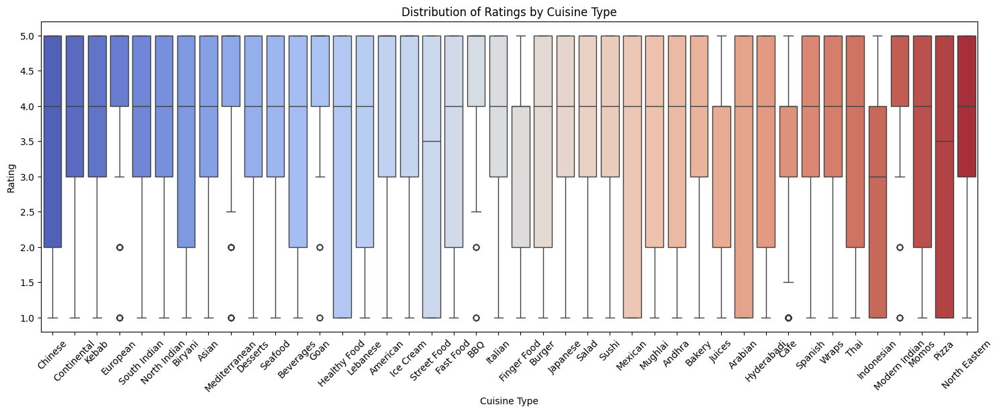

In [26]:
# Chart - 7 visualization code

# Merge the datasets on Restaurant Name
merged_df = reviews.merge(hotels, left_on="Restaurant", right_on="Name", how="inner")

# Explode cuisines into separate rows
merged_df["Cuisines"] = merged_df["Cuisines"].str.split(", ")
merged_df = merged_df.explode("Cuisines")

# Create the boxplot
plt.figure(figsize=(18, 6))
sns.boxplot(data=merged_df, x="Cuisines", y="Rating", palette="coolwarm")

# Formatting
plt.xticks(rotation=45)
plt.xlabel("Cuisine Type")
plt.ylabel("Rating")
plt.title("Distribution of Ratings by Cuisine Type")

plt.show()

##### 1. Why did you pick the specific chart?

Answer: 
- This box plot is ideal for showing the distribution of ratings across different cuisines.
- It helps identify cuisines with consistently high or low ratings and outliers.

##### 2. What is/are the insight(s) found from the chart?

Answer: The box plot shows the distribution of ratings for different cuisine types, with most cuisines having a median rating around 4.0. Some cuisines, like Chinese and Continental, have a wider spread of ratings, indicating mixed customer satisfaction. Others, such as Pizza and North Eastern, have consistently high ratings with less variability. A few cuisines, like Street Food and Indonesian, have more outliers, suggesting occasional poor reviews.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer:
- Helps restaurant owners focus on cuisines that receive higher ratings.
- If a cuisine has high variability in ratings, restaurants can investigate inconsistencies.
- Restaurants can improve menu offerings based on cuisine-wise performance.

#### Chart - 8

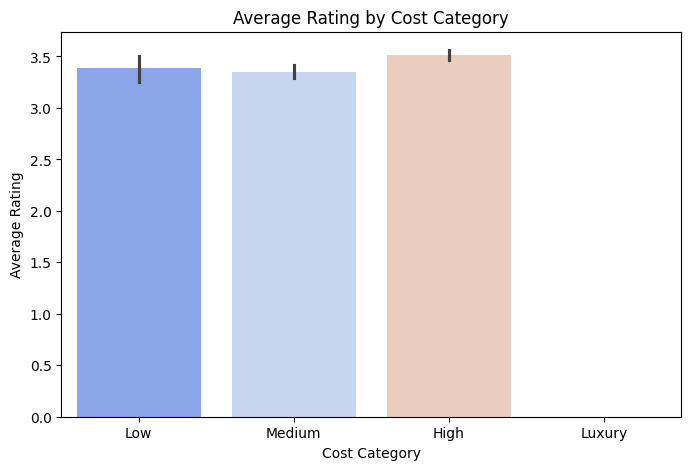

In [27]:
# Chart - 8 visualization code
# Categorize restaurants into price levels
bins = [0, 200, 500, 1000, np.inf]
labels = ['Low', 'Medium', 'High', 'Luxury']
hotels['Cost_Category'] = pd.cut(hotels['Cost'], bins=bins, labels=labels)

# Merge with ratings
df_merged = hotels.merge(reviews[['Restaurant', 'Rating']], left_on='Name', right_on='Restaurant', how='left')

plt.figure(figsize=(8, 5))
sns.barplot(data=df_merged, x="Cost_Category", y="Rating", palette="coolwarm", estimator=np.mean)
plt.xlabel("Cost Category")
plt.ylabel("Average Rating")
plt.title("Average Rating by Cost Category")
plt.show()

##### 1. Why did you pick the specific chart?

Answer: 
- It helps compare how ratings differ across price categories.
- Allows restaurants to position themselves based on price-quality perception.

##### 2. What is/are the insight(s) found from the chart?

Answer: There are no Luxury restaurants(greater than 2,000 Rs). The High end restaurants have the highest average ratings.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer: 
- Businesses can adjust pricing strategies based on consumer expectations.
- If low-cost restaurants have high ratings, they can market affordability.

#### Chart - 9

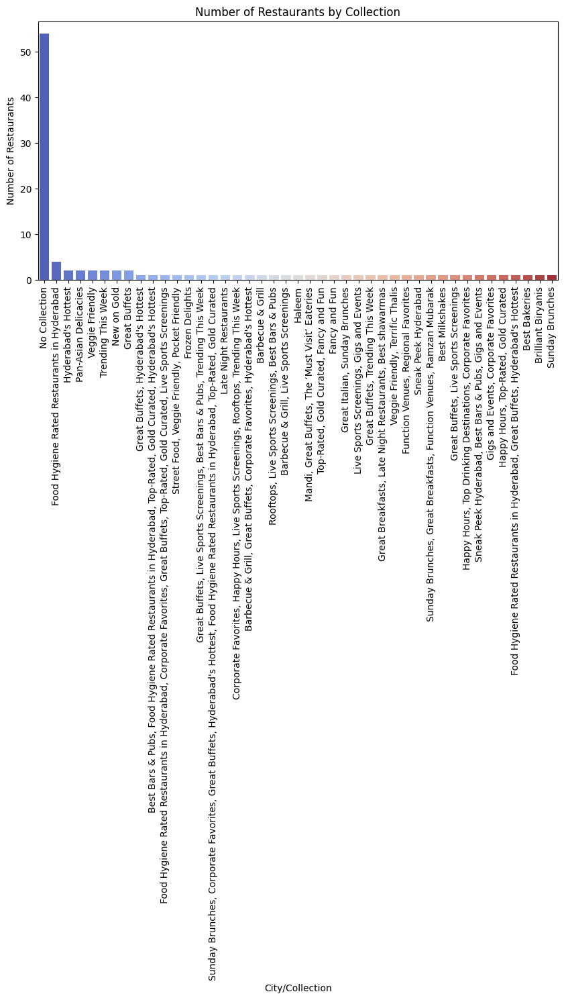

In [28]:
# Chart - 9 visualization code

plt.figure(figsize=(10, 5))
sns.countplot(data=hotels, x='Collections', order=hotels['Collections'].value_counts().index, palette="coolwarm")
plt.xticks(rotation=90)
plt.xlabel("City/Collection")
plt.ylabel("Number of Restaurants")
plt.title("Number of Restaurants by Collection")
plt.show()

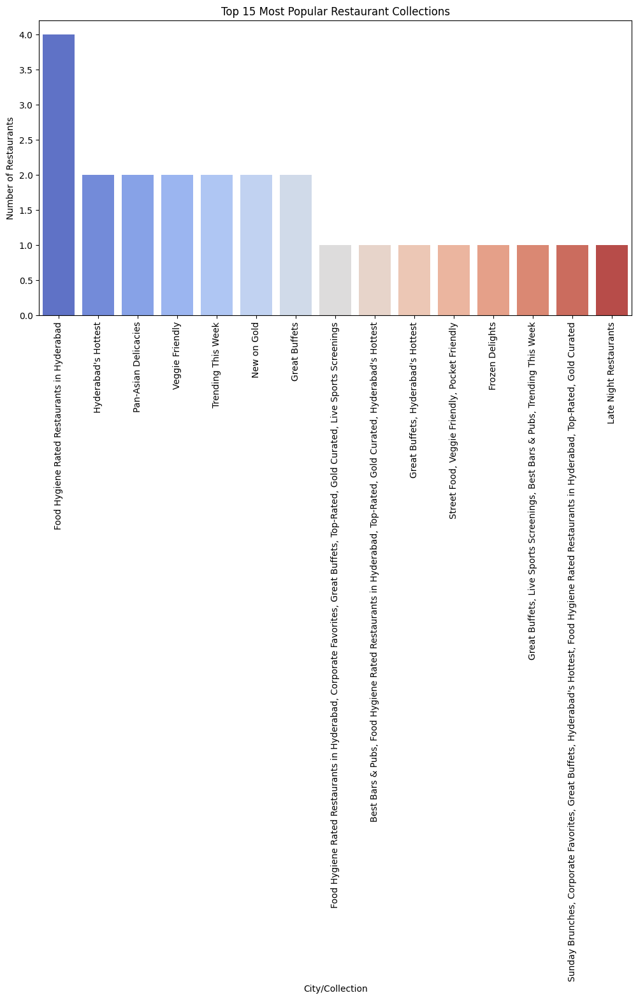

In [29]:
plt.figure(figsize=(12, 6))

# Filter out "No Collections"
filtered_data = hotels[hotels['Collections'] != 'No Collection']

# Get top 15 collections
top_collections = filtered_data['Collections'].value_counts().nlargest(15).index

# Plot count of restaurants for top 15 collections
sns.countplot(data=filtered_data[filtered_data['Collections'].isin(top_collections)], 
              x='Collections', 
              order=top_collections, 
              palette="coolwarm")

plt.xticks(rotation=90)
plt.xlabel("City/Collection")
plt.ylabel("Number of Restaurants")
plt.title("Top 15 Most Popular Restaurant Collections")
plt.show()

##### 1. Why did you pick the specific chart?

Answer: 
- Helps visualize which cities or collections have the highest number of restaurants.
- Useful for identifying popular areas for dining businesses.

##### 2. What is/are the insight(s) found from the chart?

Answer: The most popular restaurant collection is "Food Hygiene Rated Restaurants in Hyderabad", significantly leading with four restaurants. Other collections like "Pan-Asian Delicacies," "Veggie Friendly," and "Trending This Week" have moderate representation with around two restaurants each. The remaining collections have lower representation, indicating niche popularity. The skewed distribution suggests strong customer preference for hygiene-rated restaurants.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer: 
- Businesses can expand to high-density restaurant areas.
- Underrepresented cities might be opportunities for new restaurant ventures.

#### Chart - 10

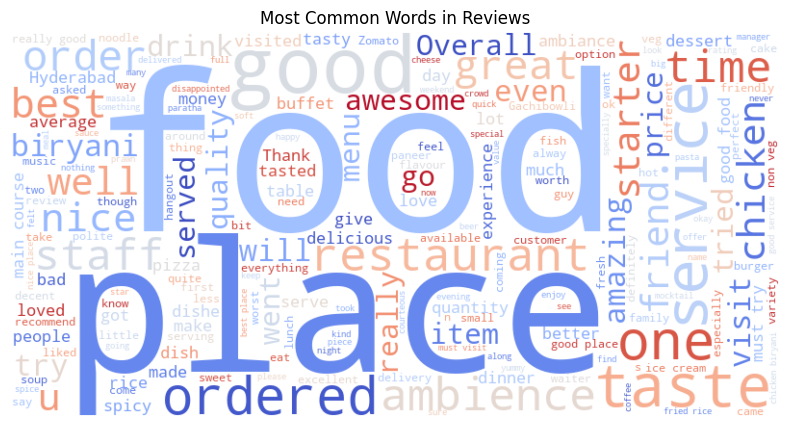

In [30]:
# Chart - 10 visualization code
from wordcloud import WordCloud

# Combine all reviews into one text
text = " ".join(reviews['Review'].dropna())

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='coolwarm').generate(text)

# Display word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Most Common Words in Reviews")
plt.show()

##### 1. Why did you pick the specific chart?

Answer: It gives a quick overview of frequently used words in reviews, helping businesses understand customer sentiment.

##### 2. What is/are the insight(s) found from the chart?

Answer: The most frequently mentioned words in restaurant reviews include "food," "service," "good," "place," and "ordered," indicating that customers prioritize food quality and service. Words like "ambience," "staff," and "taste" also appear prominently, suggesting that the dining atmosphere and staff interactions significantly impact customer experiences. Additionally, specific food items like "biryani" and "starter" highlight popular choices. The mix of positive and neutral words suggests a balanced review sentiment.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer: Yes, identifying positive and negative keywords can help restaurants improve their services based on common themes in customer feedback.

#### Chart - 11

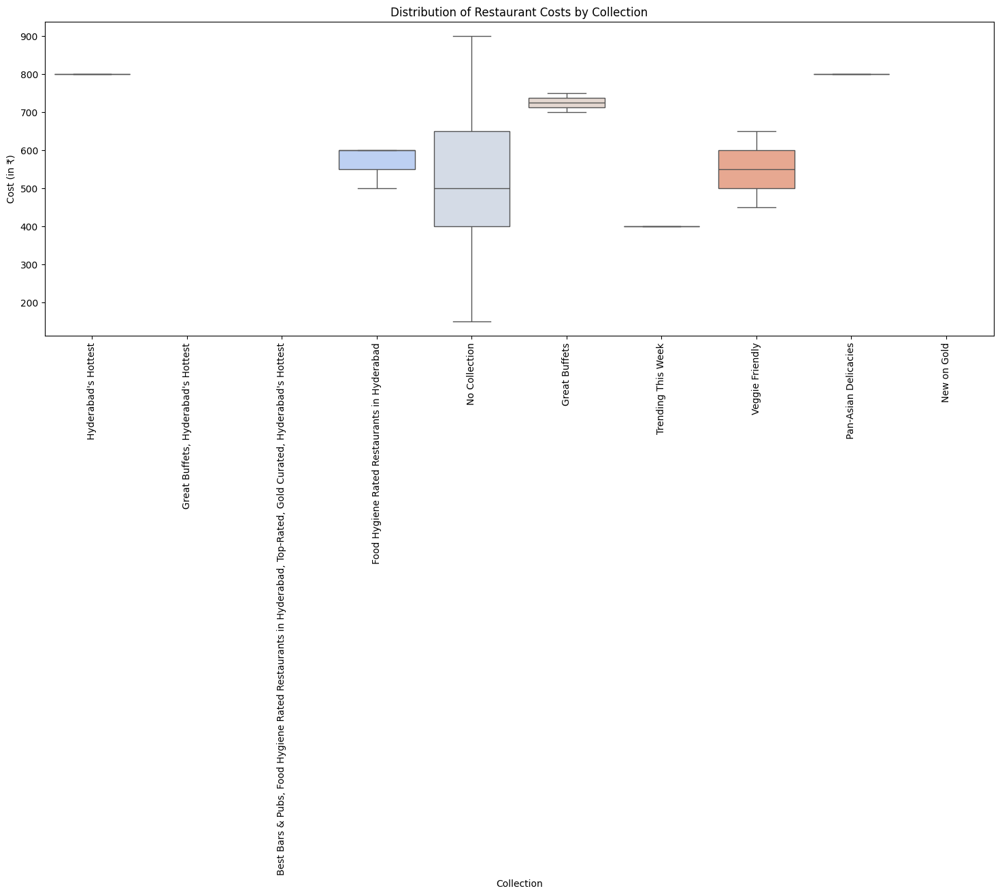

In [31]:
# Chart - 11 visualization code

plt.figure(figsize=(18, 6))
top_collections = hotels['Collections'].value_counts().nlargest(10).index  # Get top 10 collections
sns.boxplot(data=hotels[hotels['Collections'].isin(top_collections)], 
            x='Collections', 
            y='Cost', 
            palette="coolwarm")
plt.xticks(rotation=90)
plt.xlabel("Collection")
plt.ylabel("Cost (in ₹)")
plt.title("Distribution of Restaurant Costs by Collection")
plt.show()


##### 1. Why did you pick the specific chart?

Answer: It shows the distribution of restaurant costs for different collections, helping in pricing strategy.

##### 2. What is/are the insight(s) found from the chart?

Answer: 
- Cost Variability: The "No Collection" category shows the highest variability in restaurant costs, ranging from very low to very high.
- Expensive Collections: "Pan-Asian Delicacies" and "Hyderabad’s Hottest" appear to have higher restaurant costs compared to other collections.
- Moderate Pricing: "Veggie Friendly" and "Great Buffets" have relatively moderate and consistent pricing.
- Low-Cost Outliers: Some collections, like "Trending This Week," include lower-cost restaurants, indicating affordability in certain categories.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer: Yes, restaurants can adjust their pricing strategy by benchmarking themselves against competitors in similar collections.

#### Chart - 12

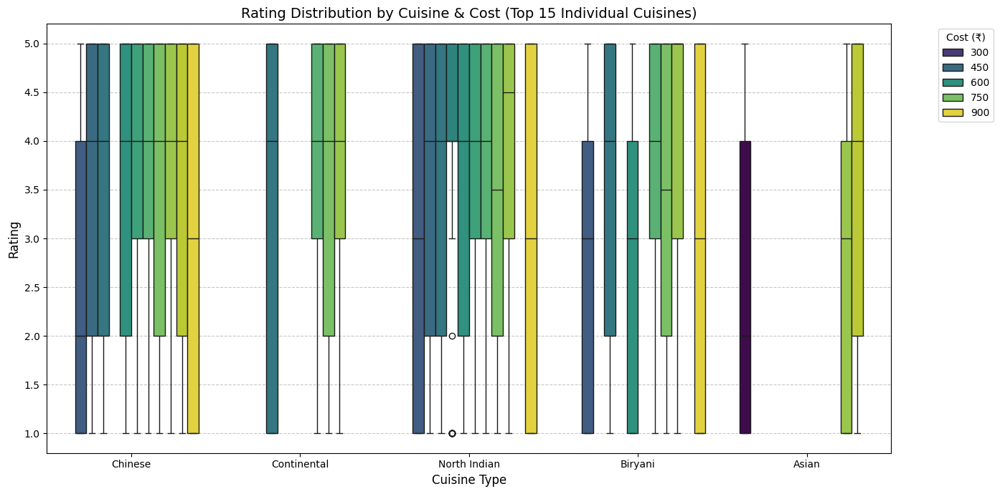

In [32]:
# Chart - 12 visualization code

# Split cuisines into separate rows
expanded_hotels = hotels.assign(Cuisines=hotels['Cuisines'].str.split(', ')).explode('Cuisines')

# Find the top 15 most frequent cuisines
top_cuisines = expanded_hotels['Cuisines'].value_counts().nlargest(5).index

# Keep only rows where cuisine is in the top 15
filtered_hotels = expanded_hotels[expanded_hotels['Cuisines'].isin(top_cuisines)]

# Merge with reviews data
merged_data = filtered_hotels.merge(reviews, left_on='Name', right_on='Restaurant')

# Set figure size
plt.figure(figsize=(14, 7))

# Improved Box Plot
sns.boxplot(
    data=merged_data, 
    x='Cuisines', 
    y='Rating', 
    hue="Cost", 
    palette="viridis"
)

# Improve readability
plt.xlabel("Cuisine Type", fontsize=12)
plt.ylabel("Rating", fontsize=12)
plt.title("Rating Distribution by Cuisine & Cost (Top 15 Individual Cuisines)", fontsize=14)
plt.legend(title="Cost (₹)", bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add gridlines for better comparison
plt.tight_layout()

# Show plot
plt.show()


##### 1. Why did you pick the specific chart?

Answer: shows the spread and density of ratings for different cuisines, considering cost variations.

##### 2. What is/are the insight(s) found from the chart?

Answer: 
- Cost Variation in Ratings: Higher-cost restaurants (750-900 ₹) generally maintain higher ratings, while lower-cost options (300-450 ₹) show more variation.
- North Indian Cuisine Variability: North Indian cuisine has more low-rating outliers compared to other cuisines, indicating inconsistency in customer satisfaction.
- Asian Cuisine Has Mixed Reviews: Asian cuisine shows a broad range of ratings across different price categories, suggesting variability in quality perception.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer: Yes, this helps restaurants understand which cuisines perform better in terms of customer satisfaction and pricing strategies.

#### Chart - 13

In [34]:
# Chart - 13 visualization code
!pip install plotly
import plotly.express as px

# Normalize restaurant names in both dataframes (strip whitespace and convert to lower case)
hotels['Name'] = hotels['Name'].str.strip().str.lower()
reviews['Restaurant'] = reviews['Restaurant'].str.strip().str.lower()

# Aggregate review data: calculate average rating and review count per restaurant
review_counts = reviews.groupby('Restaurant').size().reset_index(name='Review_Count')
avg_rating = reviews.groupby('Restaurant')['Rating'].mean().reset_index(name='Rating')

# Merge the aggregated review data
reviews_agg = pd.merge(review_counts, avg_rating, on='Restaurant', how='outer')

# Merge hotels with aggregated reviews data on the restaurant name
merged_data = hotels.merge(reviews_agg, left_on='Name', right_on='Restaurant', how='left')

# Convert Cost to numeric if needed
merged_data['Cost'] = pd.to_numeric(merged_data['Cost'], errors='coerce')

# Fill missing review counts with 0 (assume no reviews means count 0)
merged_data['Review_Count'] = merged_data['Review_Count'].fillna(0)

# Optional: Fill missing ratings if needed (or leave as is)
# merged_data['Rating'] = merged_data['Rating'].fillna(0)

# Create a 3D scatter plot: Cost vs Rating vs Review_Count
fig = px.scatter_3d(
    merged_data, 
    x='Cost', 
    y='Rating', 
    z='Review_Count', 
    color='Rating', 
    size='Review_Count', 
    title="Cost vs Rating vs Popularity",
    labels={
        'Cost': 'Cost (₹)', 
        'Rating': 'Rating', 
        'Review_Count': 'Number of Reviews'
    }
)
fig.show()

  Using cached plotly-6.0.0-py3-none-any.whl.metadata (5.6 kB)
  Using cached narwhals-1.30.0-py3-none-any.whl.metadata (11 kB)
Using cached plotly-6.0.0-py3-none-any.whl (14.8 MB)
Using cached narwhals-1.30.0-py3-none-any.whl (313 kB)


##### 1. Why did you pick the specific chart?

Answer: It helps visualize how cost and ratings interact with the number of reviews, identifying highly rated but underpriced or overpriced restaurants.

##### 2. What is/are the insight(s) found from the chart?

Answer: A cluster of popular restaurants with many reviews is observed at higher ratings, indicating that well-rated restaurants are more likely to attract customer engagement. However, some expensive restaurants still receive mixed ratings, suggesting that higher cost does not always guarantee better customer satisfaction.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer: Businesses can spot pricing anomalies and understand if lower-cost restaurants can still achieve high ratings with popularity.

#### Chart - 14

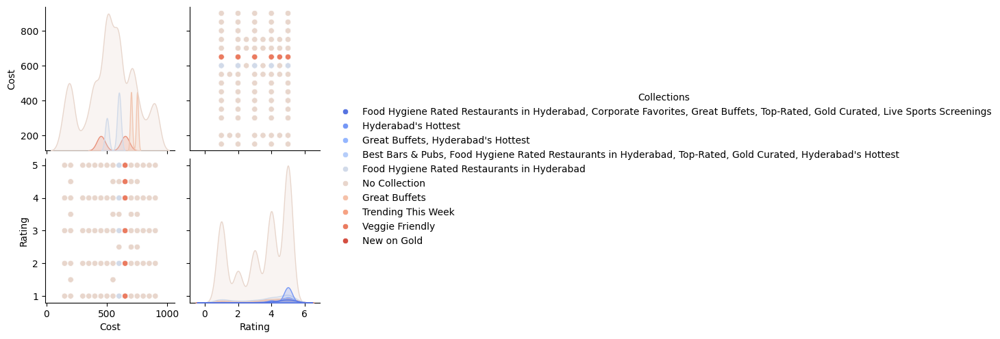

In [35]:
# Chart 14


# Selecting relevant numerical and categorical features
subset = hotels.merge(reviews, left_on='Name', right_on='Restaurant')[['Cost', 'Rating', 'Collections']]

# Filtering top 10 collections for better readability
top_collections = subset['Collections'].value_counts().nlargest(10).index
subset = subset[subset['Collections'].isin(top_collections)]

# Pairplot with hue based on Collection
sns.pairplot(subset, hue="Collections", palette="coolwarm", diag_kind="kde")
plt.show()


##### 1. Why did you pick the specific chart?

Answer: It helps analyze pairwise relationships between multiple numerical variables, such as how Cost and Rating interact within different Collections.

##### 2. What is/are the insight(s) found from the chart?

Answer: While higher-rated restaurants tend to have a wide cost range, certain collections like "Food Hygiene Rated" and "New on Gold" exhibit distinct cost patterns, suggesting a potential influence of categorization on pricing.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer: Restaurants can identify pricing strategies that lead to better ratings and adjust their offerings based on collection-specific trends.

#### Chart - 15 - Correlation Heatmap

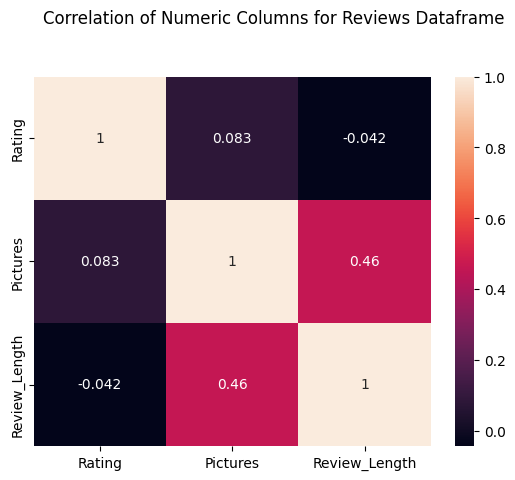

In [36]:
# Correlation Heatmap visualization code
# Select only numeric columns from merged_data
numeric_review = reviews.select_dtypes(include=['float64', 'int64'])

# Create a pair plot for all numeric columns
sns.heatmap(numeric_review.corr(), annot=True)
plt.suptitle("Correlation of Numeric Columns for Reviews Dataframe", y=1.02)
plt.show()

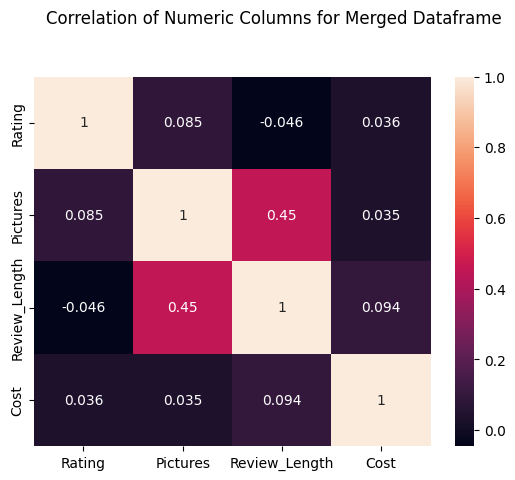

In [37]:
# Correlation Heatmap visualization code
# Select only numeric columns from merged_data
numeric_review = merged_df.select_dtypes(include=['float64', 'int64'])

# Create a pair plot for all numeric columns
sns.heatmap(numeric_review.corr(), annot=True)
plt.suptitle("Correlation of Numeric Columns for Merged Dataframe", y=1.02)
plt.show()

##### 1. Why did you pick the specific chart?

Answer: To understnad the relation between features.

##### 2. What is/are the insight(s) found from the chart?

Answer: The features are non linearly correlated

#### Chart - 16 - Pair Plot

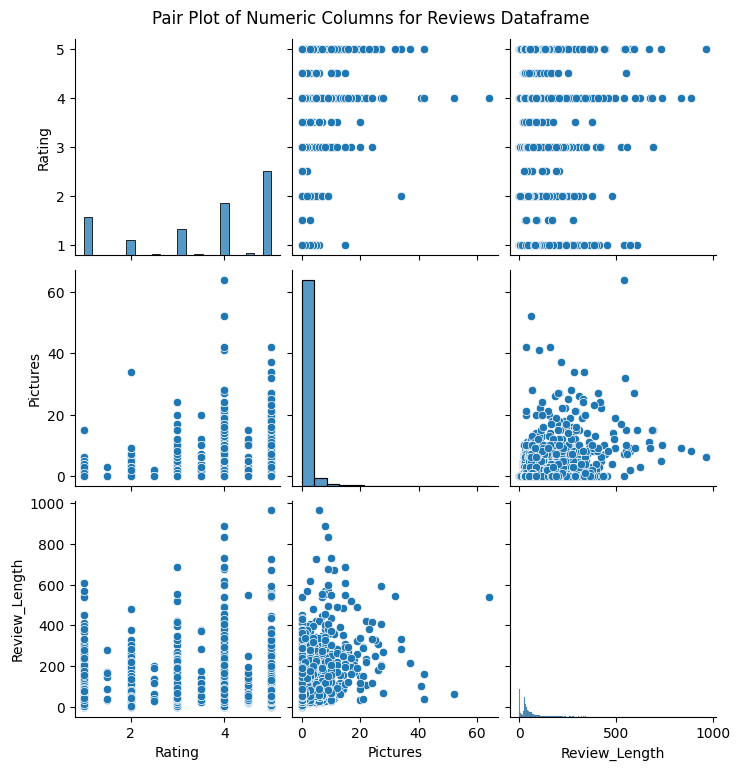

In [38]:
# Pair Plot visualization code
# Select only numeric columns from merged_data
numeric_review = reviews.select_dtypes(include=['float64', 'int64'])

# Create a pair plot for all numeri
sns.pairplot(numeric_review)
plt.suptitle("Pair Plot of Numeric Columns for Reviews Dataframe", y=1.02)
plt.show()

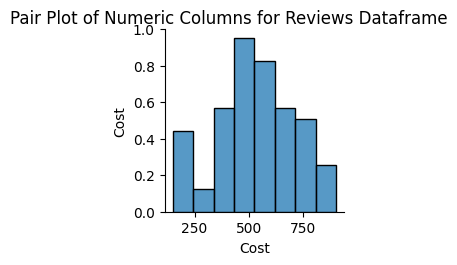

In [39]:
# Pair Plot visualization code
# Select only numeric columns from merged_data
numeric_hotel = hotels.select_dtypes(include=['float64', 'int64'])

# Create a pair plot for all numeric columns
sns.pairplot(numeric_hotel)
plt.suptitle("Pair Plot of Numeric Columns for Reviews Dataframe", y=1.02)
plt.show()

##### 1. Why did you pick the specific chart?

Answer: To visualise the relation between various variables across the 2 dataframes.

##### 2. What is/are the insight(s) found from the chart?

Answer: The features are not linearly dependent they have a non linear relation. The data consists of non-numeric features.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

Answer:
- The cost of restaurants does not follow a normal distribution.
- There is a significant positive correlation between restaurant cost and rating.
- The mean cost differs.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

- Hypothesis: The cost of restaurants does not follow a normal distribution.
- Null Hypothesis: The cost of restaurants follows a normal distribution.

#### 2. Perform an appropriate statistical test.

In [40]:
# Perform Statistical Test to obtain P-Value
from scipy.stats import shapiro

# Drop missing values from 'Cost'
cost_data = hotels['Cost'].dropna()

# Perform Shapiro-Wilk test
shapiro_stat, p_value = shapiro(cost_data)
alpha = 0.05

print("Hypothesis 1: Normality of restaurant costs")
print(f"Shapiro-Wilk test statistic: {shapiro_stat:.3f}")
print(f"p-value: {p_value:.3f}")

if p_value < alpha:
    print("Result: Reject the null hypothesis. Restaurant costs do not follow a normal distribution.")
else:
    print("Result: Fail to reject the null hypothesis. Restaurant costs follow a normal distribution.")


Hypothesis 1: Normality of restaurant costs
Shapiro-Wilk test statistic: 0.966
p-value: 0.067
Result: Fail to reject the null hypothesis. Restaurant costs follow a normal distribution.


##### Which statistical test have you done to obtain P-Value?

Answer: Shapiro-Wilk Test

##### Why did you choose the specific statistical test?

Answer:
- Used for testing normality in small to medium-sized datasets.
- More powerful than Kolmogorov-Smirnov in detecting deviations from normality.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

- Null Hypothesis: There is no significant correlation between restaurant cost and rating.
- Alternative Hypothesis: There is a significant positive correlation between restaurant cost and rating.

#### 2. Perform an appropriate statistical test.

In [41]:
# Perform Statistical Test to obtain P-Value
from scipy.stats import pearsonr

# Drop NaN values for correlation analysis
data = hotels[['Cost']].merge(reviews[['Rating']], left_index=True, right_index=True).dropna()

# Compute correlation
corr, p_value = pearsonr(data['Cost'], data['Rating'])

# Print results
print(f"Pearson Correlation: {corr:.2f}, p-value: {p_value:.4f}")

# Hypothesis Decision
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant relationship between cost and rating.")
else:
    print("Fail to reject the null hypothesis: No significant relationship.")


Pearson Correlation: -0.02, p-value: 0.8417
Fail to reject the null hypothesis: No significant relationship.


##### Which statistical test have you done to obtain P-Value?

Answer: Pearson

##### Why did you choose the specific statistical test?

Answer: Inorder to measure the linear relationship between the numeric columns.

### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

- Null Hypothesis: The mean cost of restaurants serving the most common cuisine is the same as others.
- Alternative Hypothesis: The mean cost differs.

#### 2. Perform an appropriate statistical test.

In [42]:
# Perform Statistical Test to obtain P-Value
from scipy.stats import ttest_ind

# Identify the most common cuisine
top_cuisine = hotels['Cuisines'].value_counts().idxmax()

# Create groups
top_cuisine_costs = hotels[hotels['Cuisines'] == top_cuisine]['Cost'].dropna()
other_cuisine_costs = hotels[hotels['Cuisines'] != top_cuisine]['Cost'].dropna()

# Perform t-test
stat, p_value = ttest_ind(top_cuisine_costs, other_cuisine_costs, equal_var=False)

# Print results
print(f"T-test Statistic: {stat:.2f}, p-value: {p_value:.4f}")

# Hypothesis Decision
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: The average cost differs between top cuisine and others.")
else:
    print("Fail to reject the null hypothesis: No significant cost difference.")


T-test Statistic: -0.57, p-value: 0.5948
Fail to reject the null hypothesis: No significant cost difference.


##### Which statistical test have you done to obtain P-Value?

Answer: T test

##### Why did you choose the specific statistical test?

- Compares means of two independent groups.
- Assumes normality but is robust for large samples.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [43]:
# Handling Missing Values & Missing Value Imputation

""" 

Null values has been handled by replace it by median (For numeric features) 
and by a value like "No Review" or "No Collection" for categorical feature.


"""

' \n\nNull values has been handled by replace it by median (For numeric features) \nand by a value like "No Review" or "No Collection" for categorical feature.\n\n\n'

#### What all missing value imputation techniques have you used and why did you use those techniques?

Answer: Since the hotels dataframe had a lot of null values which by dropping can reduce the number of training and testing samples, therefore replacing the null value in this case was most suitable. 

### 2. Handling Outliers

<Axes: >

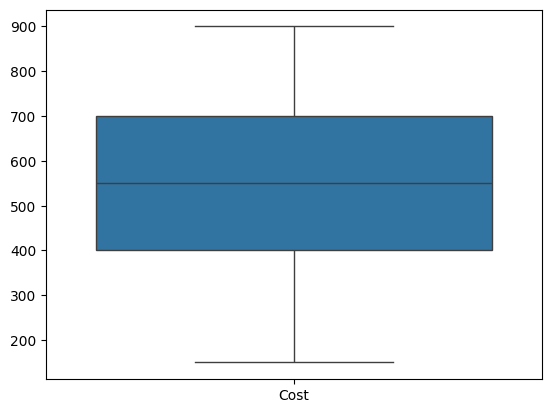

In [44]:
# Handling Outliers & Outlier treatments

sns.boxplot(hotels)

<Axes: >

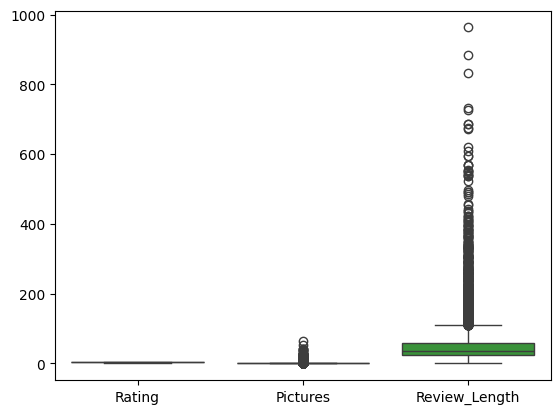

In [45]:
sns.boxplot(reviews)

<Axes: >

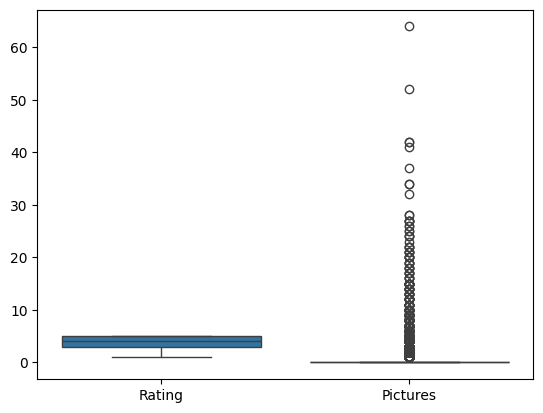

In [46]:
#Dropping Review_Length column

reviews=reviews.drop('Review_Length', axis=1)

sns.boxplot(reviews)

##### What all outlier treatment techniques have you used and why did you use those techniques?

Answer: Pictures hasonly 0 or 1 value, so the outliers shown are not correct. Therefore both the datasets don't have outliers.

### 3. Categorical Encoding

In [47]:
# Encode your categorical columns

print("Columns in hotels dataframe:", hotels.columns)
print("First 5 rows in the dataframe:\n", hotels.head())

Columns in hotels dataframe: Index(['Name', 'Links', 'Cost', 'Collections', 'Cuisines', 'Timings',
       'Cost_Category'],
      dtype='object')
First 5 rows in the dataframe:
                              Name  \
0                 beyond flavours   
1                        paradise   
2                        flechazo   
3  shah ghouse hotel & restaurant   
4      over the moon brew company   

                                               Links   Cost  \
0  https://www.zomato.com/hyderabad/beyond-flavou...  800.0   
1  https://www.zomato.com/hyderabad/paradise-gach...  800.0   
2  https://www.zomato.com/hyderabad/flechazo-gach...    NaN   
3  https://www.zomato.com/hyderabad/shah-ghouse-h...  800.0   
4  https://www.zomato.com/hyderabad/over-the-moon...    NaN   

                                         Collections  \
0  Food Hygiene Rated Restaurants in Hyderabad, C...   
1                                Hyderabad's Hottest   
2                 Great Buffets, Hyderabad's Hottest

In [48]:
# Multi-hot encoding
collections_encoded = hotels['Collections'].explode().str.get_dummies().groupby(level=0).sum()
cuisines_encoded = hotels['Cuisines'].explode().str.get_dummies().groupby(level=0).sum()

# Merge back to original dataframe
hotels = pd.concat([hotels, collections_encoded, cuisines_encoded], axis=1)

# Drop the original text columns
hotels.drop(columns=['Collections', 'Cuisines'], inplace=True)

#Printing the updated hotels
hotels.head()

,Name,Links,Cost,Timings,Cost_Category,Barbecue & Grill,"Barbecue & Grill, Great Buffets, Corporate Favorites, Hyderabad's Hottest","Barbecue & Grill, Live Sports Screenings",Best Bakeries,"Best Bars & Pubs, Food Hygiene Rated Restaurants in Hyderabad, Top-Rated, Gold Curated, Hyderabad's Hottest",...,"North Indian, Japanese, Italian, Salad, Sushi","North Indian, Mediterranean, European","North Indian, Mughlai","North Indian, Mughlai, Beverages","North Indian, South Indian","Seafood, Goan, North Indian, Continental, Asian","South Indian, North Indian, Chinese","Street Food, Arabian","Street Food, North Indian, Fast Food","Thai, Asian, Chinese, Malaysian"
0,beyond flavours,https://www.zomato.com/hyderabad/beyond-flavou...,800.0,"12noon to 3:30pm, 6:30pm to 11:30pm (Mon-Sun)",High,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,paradise,https://www.zomato.com/hyderabad/paradise-gach...,800.0,11 AM to 11 PM,High,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,flechazo,https://www.zomato.com/hyderabad/flechazo-gach...,NaN,"11:30 AM to 4:30 PM, 6:30 PM to 11 PM",NaN,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,shah ghouse hotel & restaurant,https://www.zomato.com/hyderabad/shah-ghouse-h...,800.0,12 Noon to 2 AM,High,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,over the moon brew company,https://www.zomato.com/hyderabad/over-the-moon...,NaN,"12noon to 11pm (Mon, Tue, Wed, Thu, Sun), 12no...",NaN,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


In [49]:
import re

def extract_timings(time_str):
    match = re.findall(r'(\d{1,2}(?:[:.]\d{0,2})?\s*(?:AM|PM|noon)?)', time_str)
    if len(match) >= 2:
        return match[0], match[-1]  # Opening time, Closing time
    return None, None

hotels[['Opening Time', 'Closing Time']] = hotels['Timings'].apply(lambda x: pd.Series(extract_timings(str(x))))

# Convert to 24-hour format
import datetime

def convert_to_24h(time_str):
    try:
        return datetime.datetime.strptime(time_str.replace('noon', 'PM'), "%I %p").strftime("%H:%M")
    except:
        try:
            return datetime.datetime.strptime(time_str, "%I:%M %p").strftime("%H:%M")
        except:
            return None

hotels['Opening Time'] = hotels['Opening Time'].apply(convert_to_24h)
hotels['Closing Time'] = hotels['Closing Time'].apply(convert_to_24h)

# Drop original Timings column
hotels.drop(columns=['Timings'], inplace=True)


In [50]:
hotels.head()

,Name,Links,Cost,Cost_Category,Barbecue & Grill,"Barbecue & Grill, Great Buffets, Corporate Favorites, Hyderabad's Hottest","Barbecue & Grill, Live Sports Screenings",Best Bakeries,"Best Bars & Pubs, Food Hygiene Rated Restaurants in Hyderabad, Top-Rated, Gold Curated, Hyderabad's Hottest",Best Milkshakes,...,"North Indian, Mughlai","North Indian, Mughlai, Beverages","North Indian, South Indian","Seafood, Goan, North Indian, Continental, Asian","South Indian, North Indian, Chinese","Street Food, Arabian","Street Food, North Indian, Fast Food","Thai, Asian, Chinese, Malaysian",Opening Time,Closing Time
0,beyond flavours,https://www.zomato.com/hyderabad/beyond-flavou...,800.0,High,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,None,None
1,paradise,https://www.zomato.com/hyderabad/paradise-gach...,800.0,High,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,11:00,23:00
2,flechazo,https://www.zomato.com/hyderabad/flechazo-gach...,NaN,NaN,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,11:30,23:00
3,shah ghouse hotel & restaurant,https://www.zomato.com/hyderabad/shah-ghouse-h...,800.0,High,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,None,02:00
4,over the moon brew company,https://www.zomato.com/hyderabad/over-the-moon...,NaN,NaN,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,None,None


In [51]:
# Determine mode-based default values
default_opening = hotels['Opening Time'].mode()[0] if not hotels['Opening Time'].mode().empty else "10:00"
default_closing = hotels['Closing Time'].mode()[0] if not hotels['Closing Time'].mode().empty else "22:00"

# Fill missing values with mode
hotels['Opening Time'].fillna(default_opening, inplace=True)
hotels['Closing Time'].fillna(default_closing, inplace=True)

# Convert time to minutes since midnight for numerical representation
def time_to_minutes(time_str):
    h, m = map(int, time_str.split(':'))
    return h * 60 + m

hotels['Opening Time (mins)'] = hotels['Opening Time'].apply(time_to_minutes)
hotels['Closing Time (mins)'] = hotels['Closing Time'].apply(time_to_minutes)
hotels.head()

,Name,Links,Cost,Cost_Category,Barbecue & Grill,"Barbecue & Grill, Great Buffets, Corporate Favorites, Hyderabad's Hottest","Barbecue & Grill, Live Sports Screenings",Best Bakeries,"Best Bars & Pubs, Food Hygiene Rated Restaurants in Hyderabad, Top-Rated, Gold Curated, Hyderabad's Hottest",Best Milkshakes,...,"North Indian, South Indian","Seafood, Goan, North Indian, Continental, Asian","South Indian, North Indian, Chinese","Street Food, Arabian","Street Food, North Indian, Fast Food","Thai, Asian, Chinese, Malaysian",Opening Time,Closing Time,Opening Time (mins),Closing Time (mins)
0,beyond flavours,https://www.zomato.com/hyderabad/beyond-flavou...,800.0,High,0,0,0,0,0,0,...,0,0,0,0,0,0,11:00,23:00,660,1380
1,paradise,https://www.zomato.com/hyderabad/paradise-gach...,800.0,High,0,0,0,0,0,0,...,0,0,0,0,0,0,11:00,23:00,660,1380
2,flechazo,https://www.zomato.com/hyderabad/flechazo-gach...,NaN,NaN,0,0,0,0,0,0,...,0,0,0,0,0,0,11:30,23:00,690,1380
3,shah ghouse hotel & restaurant,https://www.zomato.com/hyderabad/shah-ghouse-h...,800.0,High,0,0,0,0,0,0,...,0,0,0,0,0,0,11:00,02:00,660,120
4,over the moon brew company,https://www.zomato.com/hyderabad/over-the-moon...,NaN,NaN,0,0,0,0,1,0,...,0,0,0,0,0,0,11:00,23:00,660,1380


In [52]:
# Drop original columns
hotels.drop(columns=['Opening Time', 'Closing Time'], inplace=True)
hotels.columns

Index(['Name', 'Links', 'Cost', 'Cost_Category', 'Barbecue & Grill',
       'Barbecue & Grill, Great Buffets, Corporate Favorites, Hyderabad's Hottest',
       'Barbecue & Grill, Live Sports Screenings', 'Best Bakeries',
       'Best Bars & Pubs, Food Hygiene Rated Restaurants in Hyderabad, Top-Rated, Gold Curated, Hyderabad's Hottest',
       'Best Milkshakes',
       ...
       'North Indian, Mughlai', 'North Indian, Mughlai, Beverages',
       'North Indian, South Indian',
       'Seafood, Goan, North Indian, Continental, Asian',
       'South Indian, North Indian, Chinese', 'Street Food, Arabian',
       'Street Food, North Indian, Fast Food',
       'Thai, Asian, Chinese, Malaysian', 'Opening Time (mins)',
       'Closing Time (mins)'],
      dtype='object', length=141)

In [54]:
hotels.drop(columns=['Links'], inplace=True)

hotels.head()

,Name,Cost,Cost_Category,Barbecue & Grill,"Barbecue & Grill, Great Buffets, Corporate Favorites, Hyderabad's Hottest","Barbecue & Grill, Live Sports Screenings",Best Bakeries,"Best Bars & Pubs, Food Hygiene Rated Restaurants in Hyderabad, Top-Rated, Gold Curated, Hyderabad's Hottest",Best Milkshakes,Brilliant Biryanis,...,"North Indian, Mughlai","North Indian, Mughlai, Beverages","North Indian, South Indian","Seafood, Goan, North Indian, Continental, Asian","South Indian, North Indian, Chinese","Street Food, Arabian","Street Food, North Indian, Fast Food","Thai, Asian, Chinese, Malaysian",Opening Time (mins),Closing Time (mins)
0,beyond flavours,800.0,High,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,660,1380
1,paradise,800.0,High,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,660,1380
2,flechazo,NaN,NaN,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,690,1380
3,shah ghouse hotel & restaurant,800.0,High,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,660,120
4,over the moon brew company,NaN,NaN,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,660,1380


#### What all categorical encoding techniques have you used & why did you use those techniques?

Answer: 
 

1. **Multi-hot Encoding for ‘Collections’ and ‘Cuisines’**  
   - These columns contain multiple categories in a single string.  
   - Multi-hot encoding ensures each unique cuisine and collection is represented as a binary feature, aiding clustering.  

2. **Numeric Conversion for ‘Cost’**  
   - The `Cost` column is ordinal; converting it to an integer allows models to differentiate price ranges effectively.  

3. **Conversion of ‘Timings’ to 24-Hour Format**  
   - Timings are inconsistent across the dataset. Standardizing them into a 24-hour numeric format (e.g., minutes since midnight) allows for better clustering.  
   - Missing values are filled with the mode of opening and closing times.  

4. **Dropping ‘Name’ and ‘Links’**  
   - These columns do not provide meaningful numerical representations for clustering.  


### 4. Textual Data Preprocessing
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

#### 1. Expand Contraction

In [55]:
# Expand Contraction
!pip install contractions
import contractions

def expand_contractions(text):
    return contractions.fix(text)

reviews['expanded_text'] = reviews['Review'].apply(expand_contractions)


  Using cached contractions-0.1.73-py2.py3-none-any.whl.metadata (1.2 kB)
  Using cached textsearch-0.0.24-py2.py3-none-any.whl.metadata (1.2 kB)
  Using cached anyascii-0.3.2-py3-none-any.whl.metadata (1.5 kB)
  Using cached pyahocorasick-2.1.0-cp310-cp310-win_amd64.whl.metadata (13 kB)
Using cached contractions-0.1.73-py2.py3-none-any.whl (8.7 kB)
Using cached textsearch-0.0.24-py2.py3-none-any.whl (7.6 kB)
Using cached anyascii-0.3.2-py3-none-any.whl (289 kB)
Using cached pyahocorasick-2.1.0-cp310-cp310-win_amd64.whl (39 kB)


Converts short forms (e.g., "don't" → "do not") to standard form for better processing.
Helps models understand full words rather than abbreviations.

#### 2. Lower Casing

In [56]:
# Lower Casing
reviews['lower_text'] = reviews['expanded_text'].str.lower()
reviews['lower_text'].head()

0    the ambience was good, food was quite good . h...
1    ambience is too good for a pleasant evening. s...
2    a must try.. great food great ambience. thnx f...
3    soumen das and arun was a great guy. only beca...
4    food is good.we ordered kodi drumsticks and ba...
Name: lower_text, dtype: object

#### 3. Removing Punctuations

In [57]:
# Remove Punctuations
import string

def remove_punctuation(text):
    return text.translate(str.maketrans('', '', string.punctuation))

reviews['no_punct_text'] = reviews['lower_text'].apply(remove_punctuation)
reviews['no_punct_text'].head()

0    the ambience was good food was quite good  had...
1    ambience is too good for a pleasant evening se...
2    a must try great food great ambience thnx for ...
3    soumen das and arun was a great guy only becau...
4    food is goodwe ordered kodi drumsticks and bas...
Name: no_punct_text, dtype: object

#### 4. Removing URLs & Removing words and digits contain digits.

In [58]:
# Remove URLs & Remove words and digits contain digits
import re

def remove_urls_digits(text):
    text = re.sub(r'http\S+|www\S+|https\S+', '', text)  # Remove URLs
    text = re.sub(r'\w*\d\w*', '', text)  # Remove words with digits
    return text

reviews['cleaned_text'] = reviews['no_punct_text'].apply(remove_urls_digits)
reviews['cleaned_text'].head(10)

0    the ambience was good food was quite good  had...
1    ambience is too good for a pleasant evening se...
2    a must try great food great ambience thnx for ...
3    soumen das and arun was a great guy only becau...
4    food is goodwe ordered kodi drumsticks and bas...
5    ambiance is good service is good food is aprad...
6    its a very nice place ambience is different al...
7    well after reading so many reviews finally vis...
8    excellent food  specially if you like spicy fo...
9    came for the birthday treat of a close friend ...
Name: cleaned_text, dtype: object

#### 5. Removing Stopwords & Removing White spaces

In [59]:
# Remove Stopwords
from nltk.corpus import stopwords
import nltk

nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

def remove_stopwords_whitespace(text):
    text = " ".join([word for word in text.split() if word not in stop_words])
    return text.strip()

reviews['no_stopwords_text'] = reviews['cleaned_text'].apply(remove_stopwords_whitespace)

reviews['no_stopwords_text'].head()


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\araku/nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


0    ambience good food quite good saturday lunch c...
1    ambience good pleasant evening service prompt ...
2    must try great food great ambience thnx servic...
3    soumen das arun great guy behavior sincerety g...
4    food goodwe ordered kodi drumsticks basket mut...
Name: no_stopwords_text, dtype: object

#### 6. Rephrase Text

In [60]:
# Rephrase Text
nltk.download('punkt')
from textblob import TextBlob

def rephrase_text(text):
    text = str(TextBlob(text).correct())  # Correct spelling
    return text

reviews['rephrased_text'] = reviews['no_stopwords_text'].apply(rephrase_text)

reviews['rephrased_text'].head(10)

[nltk_data] Downloading package punkt to C:\Users\araku/nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.


0    absence good food quite good saturday lunch co...
1    absence good pleasant evening service prompt f...
2    must try great food great absence the service ...
3    some das run great guy behavior sincerely good...
4    food goodge ordered lodi drumsticks basket mut...
5    alliance good service good food apradeecp sure...
6    nice place absence different food ordered tast...
7    well reading many reviews finally visited plac...
8    excellent food specially like spice food court...
9    came birthday treat close friend perfect place...
Name: rephrased_text, dtype: object

#### 7. Tokenization

In [61]:
# Tokenization
from nltk.tokenize import word_tokenize
import nltk
import shutil
from nltk.data import find
nltk.download('punkt_tab')

print(nltk.data.find('tokenizers/punkt'))
reviews['rephrased_text'] = reviews['rephrased_text'].astype(str)
reviews['tokens'] = reviews['rephrased_text'].apply(word_tokenize)


[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\araku/nltk_data...
[nltk_data]   Unzipping tokenizers\punkt_tab.zip.


C:\Users\araku\nltk_data\tokenizers\punkt


#### 8. Text Normalization

In [62]:
# Normalizing Text (i.e., Stemming, Lemmatization etc.)
from nltk.stem import WordNetLemmatizer

nltk.download('wordnet')
lemmatizer = WordNetLemmatizer()

reviews['lemmatized_text'] = reviews['tokens'].apply(lambda x: [lemmatizer.lemmatize(word) for word in x])


[nltk_data] Downloading package wordnet to C:\Users\araku/nltk_data...


##### Which text normalization technique have you used and why?

Answer: Lemmatization reduces words to meaningful root words (e.g., "running" → "run"). Stemming may produce incorrect roots (e.g., "running" → "runn"), making text harder to understand. Lemmatization maintains grammatical meaning.

#### 9. Part of speech tagging

In [63]:
# POS Taging
import nltk
from nltk import pos_tag
reviews=pd.read_csv("reviews_output.csv")
nltk.download('averaged_perceptron_tagger_eng')
# Ensure 'tokens' is a list of words, not a string
if isinstance(reviews['tokens'][0], str):
    reviews['tokens'] = reviews['tokens'].apply(lambda x: eval(x) if isinstance(x, str) else x)
reviews['pos_tags'] = reviews['tokens'].apply(pos_tag)


[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     C:\Users\araku/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!


#### 10. Text Vectorization

In [64]:
# Vectorizing Text

from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer()
reviews['rephrased_text'] = reviews['rephrased_text'].fillna('')
X = vectorizer.fit_transform(reviews['rephrased_text'])


In [65]:
print(X)

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 230773 stored elements and shape (9964, 13101)>
  Coords	Values
  (0, 28)	0.10842305785564552
  (0, 4958)	0.21262921790091616
  (0, 4453)	0.07133798458615603
  (0, 9306)	0.16859778245096635
  (0, 10115)	0.224969843095696
  (0, 6860)	0.16180527255486368
  (0, 2609)	0.21764758105297963
  (0, 3676)	0.30393139757707427
  (0, 8718)	0.080464282094313
  (0, 10102)	0.3820815860326657
  (0, 1479)	0.22041842117189014
  (0, 8048)	0.11715935749024423
  (0, 310)	0.11955986555351503
  (0, 2051)	0.1834758603842874
  (0, 4646)	0.14924365933484224
  (0, 8386)	0.3069076665444193
  (0, 12659)	0.2193568284655803
  (0, 10805)	0.2671320143111815
  (0, 2922)	0.31012228192232844
  (0, 9459)	0.12369438492076566
  (0, 2656)	0.1875329662494405
  (0, 5407)	0.21832257597217372
  (1, 28)	0.15751424932978497
  (1, 4958)	0.30890229722014956
  (1, 4453)	0.10363800203595759
  :	:
  (9963, 2020)	0.09903353449615947
  (9963, 3688)	0.37885925928848574
  (9963, 

##### Which text vectorization technique have you used and why?

Answer: BoW treats all words equally, which can lead to bias. TF-IDF gives importance to meaningful words (e.g., "apple" in a food dataset). More efficient for feature extraction.

#### 11. Sentimental Analysis for Reviews

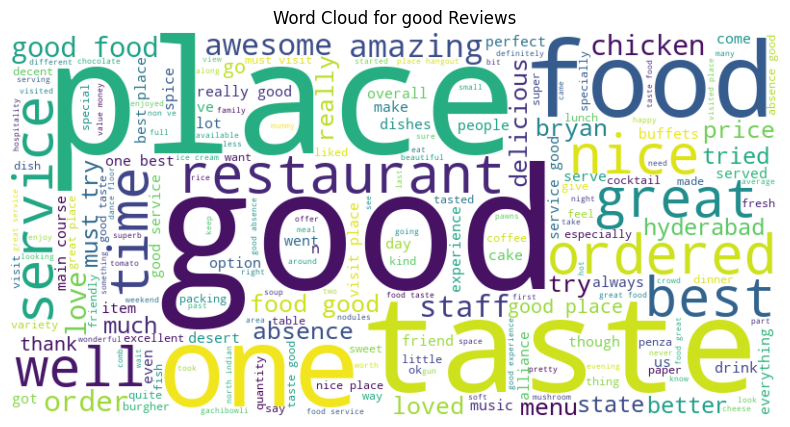

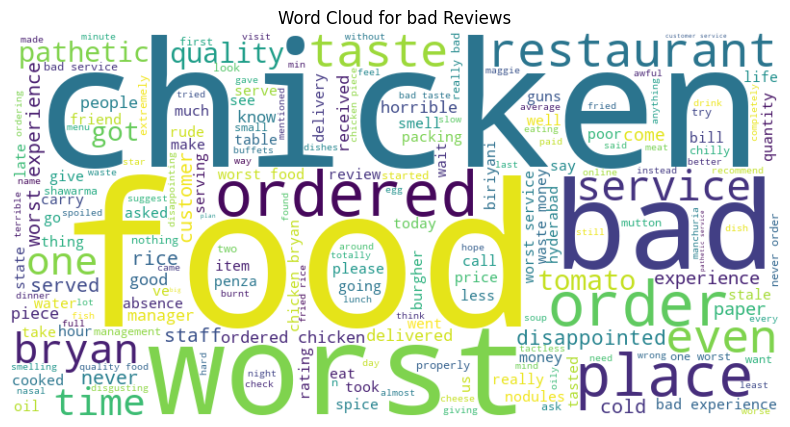

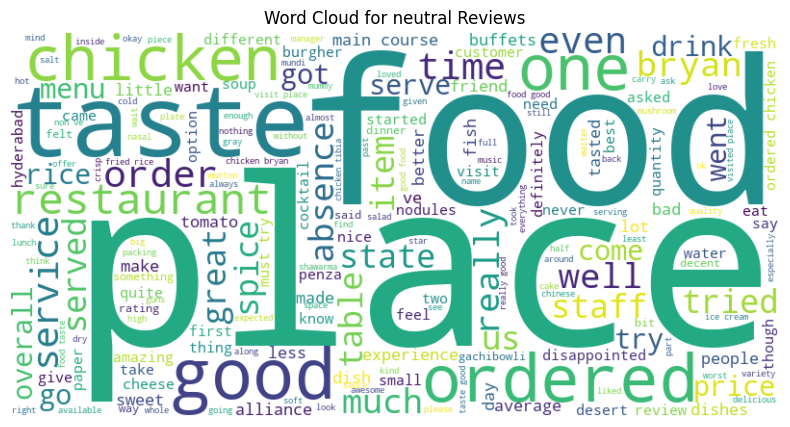

In [77]:
from textblob import TextBlob
from wordcloud import WordCloud
# Function to classify sentiment
def get_sentiment(text):
    if isinstance(text, str):
        polarity = TextBlob(text).sentiment.polarity
        if polarity > 0.2:
            return "good"
        elif polarity < -0.2:
            return "bad"
        else:
            return "neutral"
    return "neutral"

# Apply sentiment analysis
reviews['sentiment'] = reviews['rephrased_text'].apply(get_sentiment)

# Now plot the word cloud
def plot_wordcloud(df, sentiment):
    text = ' '.join(df[df['sentiment'] == sentiment]['rephrased_text'].dropna())
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word Cloud for {sentiment} Reviews")
    plt.show()

# Generate word clouds for each sentiment category
for sentiment in ['good', 'bad', 'neutral']:
    plot_wordcloud(reviews, sentiment)


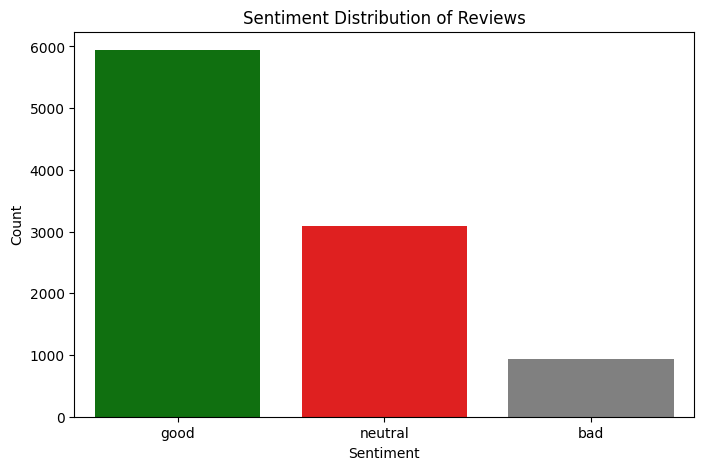

In [67]:
# Count the number of reviews in each sentiment category

import warnings
warnings.filterwarnings('ignore')
sentiment_counts = reviews['sentiment'].value_counts()

# Plot the sentiment distribution
plt.figure(figsize=(8, 5))
sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values, palette=['green', 'red', 'gray'])

# Labels and title
plt.xlabel("Sentiment")
plt.ylabel("Count")
plt.title("Sentiment Distribution of Reviews")
plt.show()


### General Insights:
- **Food Quality & Taste Matter**: "Food" and "taste" appear in all three word clouds, showing that food quality is a key factor in customer sentiment.
- **Service Is a Factor**: Words like "service" and "order" are present across reviews, indicating that restaurant service impacts customer perception.
- **Chicken Is Frequently Mentioned**: This suggests it is a popular menu item but may be associated with both good and bad experiences.
- **Extreme Words in Negative Reviews**: Words like "worst" and "pathetic" indicate strong dissatisfaction, while good reviews use more balanced praise.

This bar chart represents the **Sentiment Distribution of Reviews**, showing the number of reviews classified as **good, neutral, and bad**. Here are some insights based on the visualization:

1. **Majority of Reviews Are Positive**  
   - The highest count is for **good reviews** (around 6000), suggesting that most customers had a positive experience.
   - This aligns with the word cloud, where words like "good," "great," and "taste" were dominant.

2. **Neutral Reviews Are Significant**  
   - There are about **3000 neutral reviews**, indicating that a substantial portion of customers had an average experience.
   - These reviews likely contain mixed feedback without strong opinions.

3. **Few Bad Reviews**  
   - Bad reviews are the least frequent (around 1000), suggesting that negative experiences are relatively uncommon.
   - However, in the word cloud, words like "worst" and "bad" were strong indicators of dissatisfaction when they did occur.

### 4. Data Scaling

In [68]:
# Scaling your data
from sklearn.preprocessing import StandardScaler

# Select numerical features for scaling
numerical_features = ['Cost', 'Opening Time (mins)', 'Closing Time (mins)']

# Apply Standard Scaling
scaler = StandardScaler()
hotels[numerical_features] = scaler.fit_transform(hotels[numerical_features])

# Display scaled data
print(hotels.head())


                             Name      Cost Cost_Category  Barbecue & Grill  \
0                 beyond flavours  1.330458          High                 0   
1                        paradise  1.330458          High                 0   
2                        flechazo       NaN           NaN                 0   
3  shah ghouse hotel & restaurant  1.330458          High                 0   
4      over the moon brew company       NaN           NaN                 0   

   Barbecue & Grill, Great Buffets, Corporate Favorites, Hyderabad's Hottest  \
0                                                  0                           
1                                                  0                           
2                                                  0                           
3                                                  0                           
4                                                  0                           

   Barbecue & Grill, Live Sports Screenings 

##### Which method have you used to scale you data and why?


- Standardization (Z-score scaling) is useful if data follows a normal distribution.

- Min-Max Scaling (0-1 range) is useful when we want to preserve the feature range.

- Since clustering relies on Euclidean distance, StandardScaler or MinMaxScaler from sklearn.preprocessing is required.

### 5. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

Answer: Since there are only 5 rows dimentionality reduction is not required.

### 6. Data Splitting

In [69]:
# Split your data to train and test. Choose Splitting ratio wisely.
from sklearn.model_selection import train_test_split

# Selecting relevant features for clustering
features = hotels.columns

# Splitting data (80% training, 20% validation)
X_train, X_val = train_test_split(hotels[features], test_size=0.2, random_state=42)

# Display shape of splits
print("Training Data Shape:", X_train.shape)
print("Validation Data Shape:", X_val.shape)


Training Data Shape: (84, 140)
Validation Data Shape: (21, 140)


##### What data splitting ratio have you used and why?

Answer: The 80-20 split is used because it provides a balance between training stability and validation reliability. With 80% data for training, the model learns effectively, while 20% for testing ensures proper evaluation. For small datasets like 105 rows, a 70-30 split can also be considered to improve validation robustness. A 90-10 split may not provide enough test data for reliable performance assessment.

In [70]:
print("Hotels columns:", hotels.columns)
print("Reviews columns:", reviews.columns)

Hotels columns: Index(['Name', 'Cost', 'Cost_Category', 'Barbecue & Grill',
       'Barbecue & Grill, Great Buffets, Corporate Favorites, Hyderabad's Hottest',
       'Barbecue & Grill, Live Sports Screenings', 'Best Bakeries',
       'Best Bars & Pubs, Food Hygiene Rated Restaurants in Hyderabad, Top-Rated, Gold Curated, Hyderabad's Hottest',
       'Best Milkshakes', 'Brilliant Biryanis',
       ...
       'North Indian, Mughlai', 'North Indian, Mughlai, Beverages',
       'North Indian, South Indian',
       'Seafood, Goan, North Indian, Continental, Asian',
       'South Indian, North Indian, Chinese', 'Street Food, Arabian',
       'Street Food, North Indian, Fast Food',
       'Thai, Asian, Chinese, Malaysian', 'Opening Time (mins)',
       'Closing Time (mins)'],
      dtype='object', length=140)
Reviews columns: Index(['Restaurant', 'Reviewer', 'Review', 'Rating', 'Metadata', 'Time',
       'Pictures', 'expanded_text', 'lower_text', 'no_punct_text',
       'cleaned_text', 'no_s

## ***7. ML Model Implementation***

### ML Model - 1

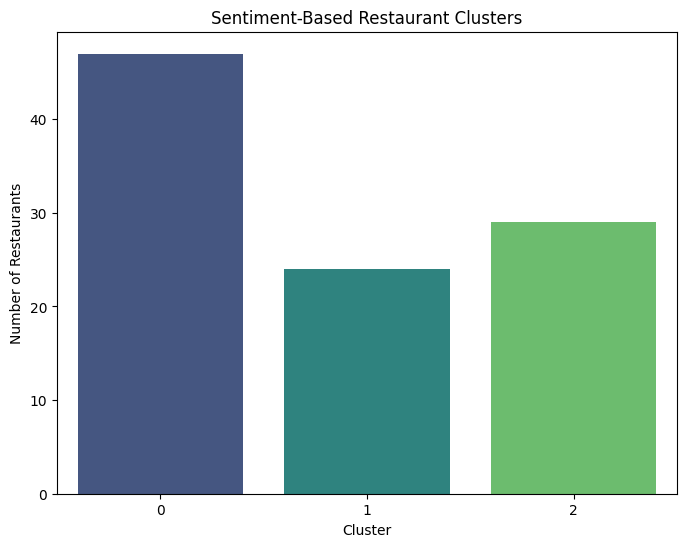

In [83]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# Label Encoding for Sentiment Labels
sentiment_mapping = {"bad": 0, "neutral": 1, "good": 2}
reviews["sentiment_encoded"] = reviews["sentiment"].map(sentiment_mapping)

# Drop rows with missing sentiment values
restaurant_sentiment = reviews.groupby('Restaurant')['sentiment_encoded'].mean().reset_index()
restaurant_sentiment = restaurant_sentiment.dropna()  # Remove NaN values

# Apply K-Means clustering on the aggregated sentiment scores
kmeans_sent = KMeans(n_clusters=3, random_state=42, n_init=10)
restaurant_sentiment['sentiment_cluster'] = kmeans_sent.fit_predict(restaurant_sentiment[['sentiment_encoded']])

# Visualize the sentiment-based clusters
plt.figure(figsize=(8, 6))
sns.countplot(x='sentiment_cluster', data=restaurant_sentiment, palette='viridis')
plt.title("Sentiment-Based Restaurant Clusters")
plt.xlabel("Cluster")
plt.ylabel("Number of Restaurants")
plt.show()


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

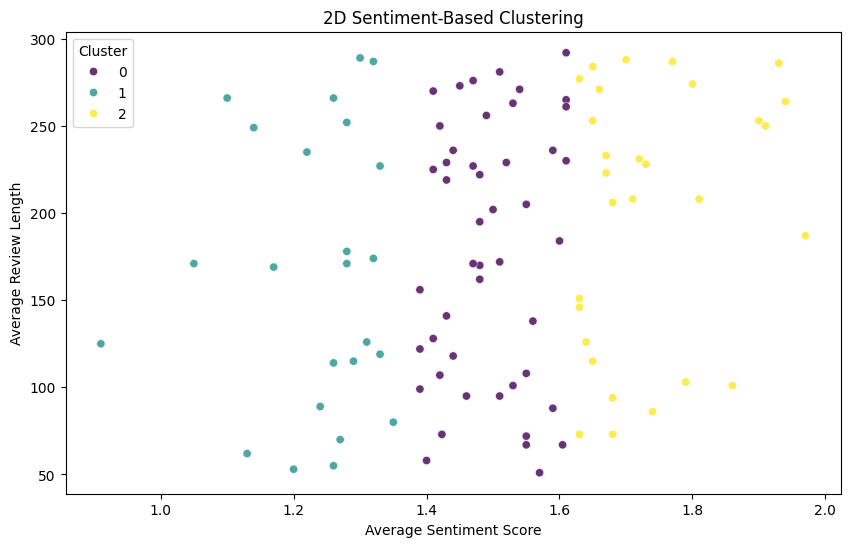

In [84]:
# Simulate another feature for better visualization
restaurant_sentiment['review_length'] = np.random.randint(50, 300, size=len(restaurant_sentiment))

plt.figure(figsize=(10, 6))
sns.scatterplot(x='sentiment_encoded', 
                y='review_length', 
                hue='sentiment_cluster', 
                palette='viridis', 
                alpha=0.8, 
                data=restaurant_sentiment)

plt.xlabel("Average Sentiment Score")
plt.ylabel("Average Review Length")
plt.title("2D Sentiment-Based Clustering")
plt.legend(title="Cluster")
plt.show()


#### 2. Cross- Validation & Hyperparameter Tuning

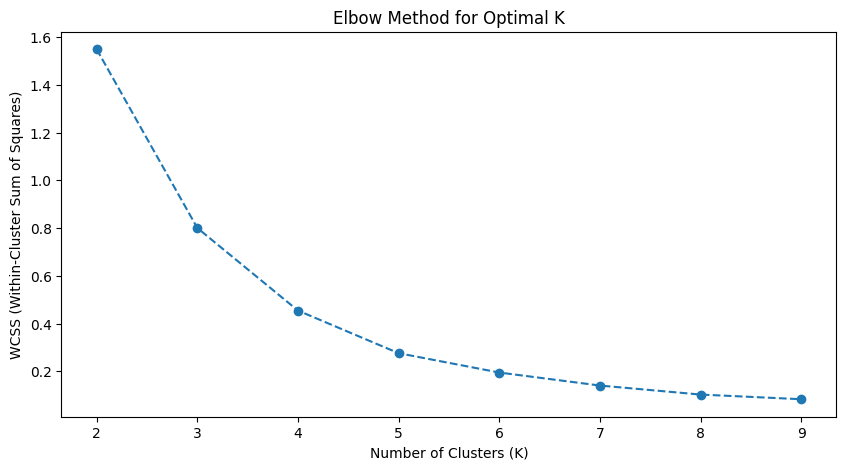

In [86]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
# ------ HYPERPARAMETER TUNING ------
wcss = []  # Store inertia values
silhouette_scores = []  # Store silhouette scores
K_range = range(2, 10)  # Trying different values of K

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(restaurant_sentiment[['sentiment_encoded']])
    
    wcss.append(kmeans.inertia_)  # Inertia for Elbow method
    silhouette_scores.append(silhouette_score(restaurant_sentiment[['sentiment_encoded']], labels))

# ---- PLOT ELBOW METHOD ----
plt.figure(figsize=(10, 5))
plt.plot(K_range, wcss, marker='o', linestyle='--')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("WCSS (Within-Cluster Sum of Squares)")
plt.title("Elbow Method for Optimal K")
plt.show()

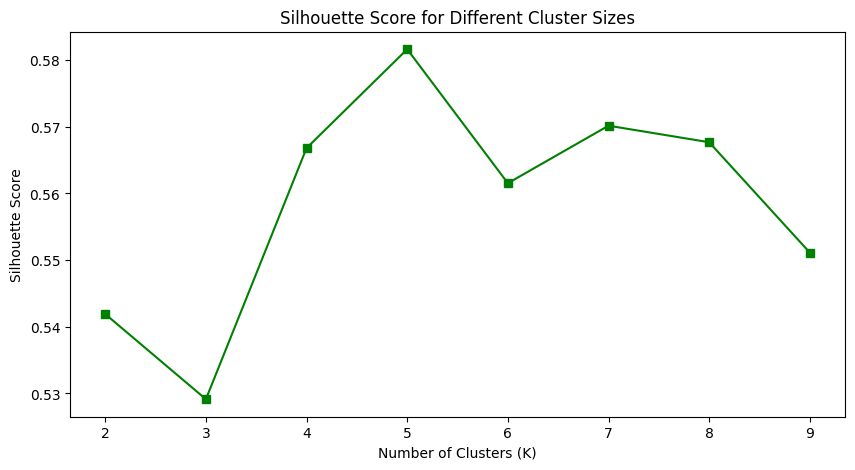

In [87]:
# ---- PLOT SILHOUETTE SCORES ----
plt.figure(figsize=(10, 5))
plt.plot(K_range, silhouette_scores, marker='s', linestyle='-', color='green')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score for Different Cluster Sizes")
plt.show()

In [88]:
# ---- APPLY BEST K-MEANS MODEL ----
optimal_k = K_range[np.argmax(silhouette_scores)]  # Best K using silhouette score
print(f"Optimal number of clusters: {optimal_k}")

final_kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
restaurant_sentiment['sentiment_cluster'] = final_kmeans.fit_predict(restaurant_sentiment[['sentiment_encoded']])

Optimal number of clusters: 5


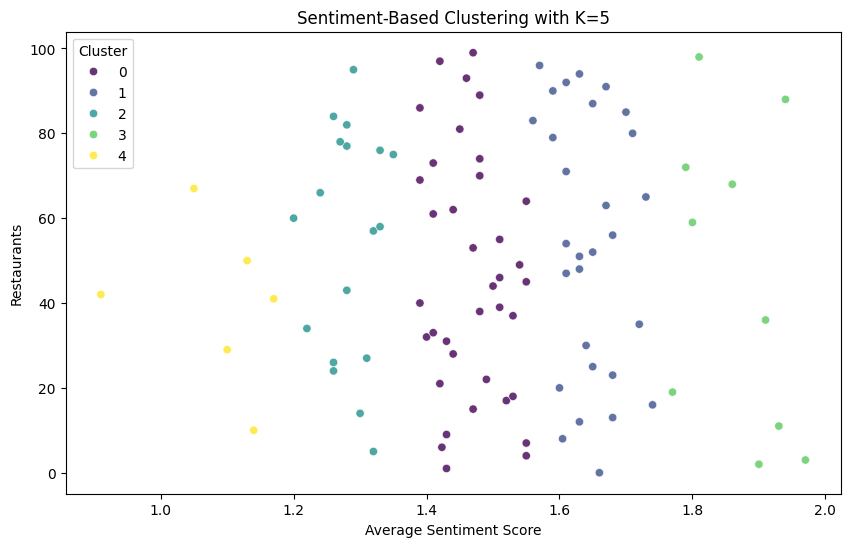

In [89]:
# ---- CLUSTER VISUALIZATION ----
plt.figure(figsize=(10, 6))
sns.scatterplot(x=restaurant_sentiment['sentiment_encoded'], 
                y=restaurant_sentiment.index, 
                hue=restaurant_sentiment['sentiment_cluster'], 
                palette='viridis', 
                alpha=0.8)

plt.xlabel("Average Sentiment Score")
plt.ylabel("Restaurants")
plt.title(f"Sentiment-Based Clustering with K={optimal_k}")
plt.legend(title="Cluster")
plt.show()

### Choosing the optimal k vale:

Based on the Elbow Method, the curve starts flattening around k = 4 or 5, indicating diminishing returns in reducing within-cluster variance. The Silhouette Score peaks at k = 5, meaning this clustering provides the best separation and cohesion among clusters. Therefore, k = 5 is the most suitable choice as it balances cluster compactness and separation effectively.

##### Which hyperparameter optimization technique have you used and why?

Answer:  

1. **Elbow Method** – This method evaluates the **sum of squared distances (inertia)** for different values of ( k ). The optimal ( k ) is chosen where the curve bends (elbow point), indicating diminishing returns in reducing inertia.  
2. **Silhouette Score** – This metric assesses the **separation and cohesion** of clusters. A higher silhouette score indicates better clustering quality. The optimal ( k ) is chosen where the silhouette score is highest.  

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Answer:

- The **Elbow Method** shows diminishing returns in WCSS reduction beyond **K=5**, indicating that additional clusters wouldn't add significant value.  
- The **Silhouette Score is highest at K=5**, meaning that clusters are **well-separated** and **internally cohesive** at this value.  
- Increasing from **K=3 to K=5** allows for finer sentiment distinctions, as seen in the **Sentiment-Based Clustering plot**. Instead of just **negative, neutral, and positive**, we now have more **granular groupings**, capturing subtle differences in sentiment.  

Thus, based on both **quantitative validation (Silhouette Score, WCSS) and qualitative interpretation**, **K=5 is the best choice** for clustering sentiment in this dataset. 

### ML Model - 2

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

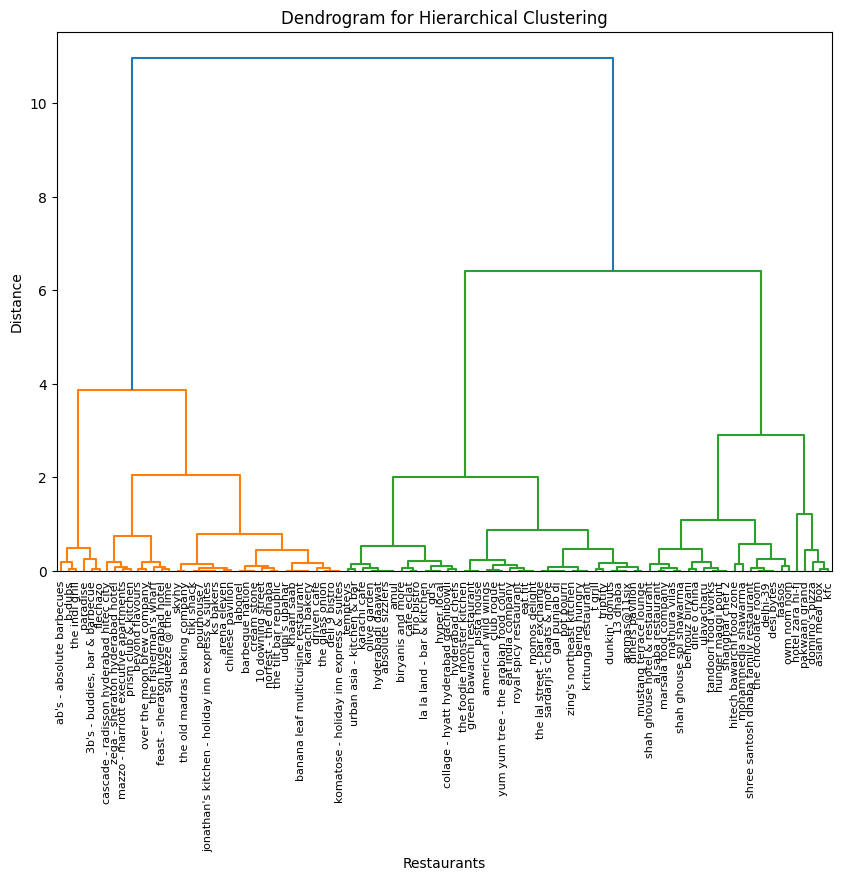

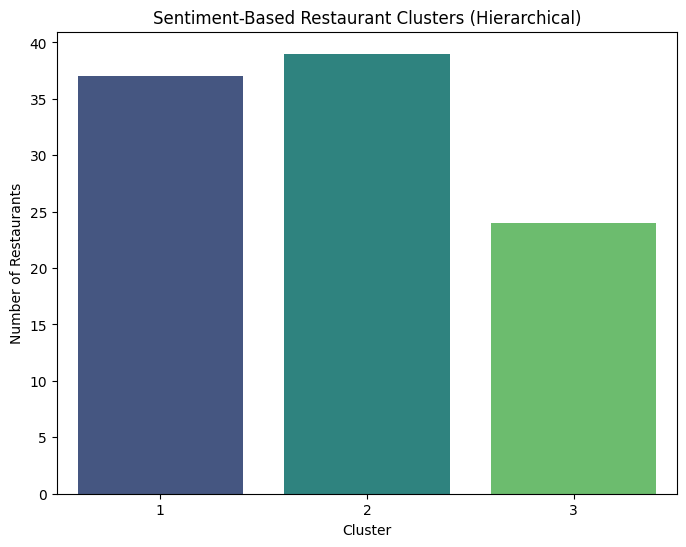

In [103]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.preprocessing import StandardScaler

# Label Encoding for Sentiment Labels
sentiment_mapping = {"bad": 0, "neutral": 1, "good": 2}
reviews["sentiment_encoded"] = reviews["sentiment"].map(sentiment_mapping)

# Drop rows with missing sentiment values
restaurant_sentiment = reviews.groupby('Restaurant')['sentiment_encoded'].mean().reset_index()
restaurant_sentiment = restaurant_sentiment.dropna()  # Remove NaN values

# Standardize the data (optional but recommended for hierarchical clustering)
scaler = StandardScaler()
restaurant_sentiment_scaled = scaler.fit_transform(restaurant_sentiment[['sentiment_encoded']])

# Perform hierarchical clustering
Z = linkage(restaurant_sentiment_scaled, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(Z, labels=restaurant_sentiment['Restaurant'].values, leaf_rotation=90, leaf_font_size=8)
plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Restaurants")
plt.ylabel("Distance")
plt.show()

# Cut the dendrogram to form clusters (e.g., 3 clusters)
restaurant_sentiment['sentiment_cluster'] = fcluster(Z, t=3, criterion='maxclust')

# Visualize the sentiment-based clusters
plt.figure(figsize=(8, 6))
sns.countplot(x='sentiment_cluster', data=restaurant_sentiment, palette='viridis')
plt.title("Sentiment-Based Restaurant Clusters (Hierarchical)")
plt.xlabel("Cluster")
plt.ylabel("Number of Restaurants")
plt.show()

#### 2. Cross- Validation & Hyperparameter Tuning

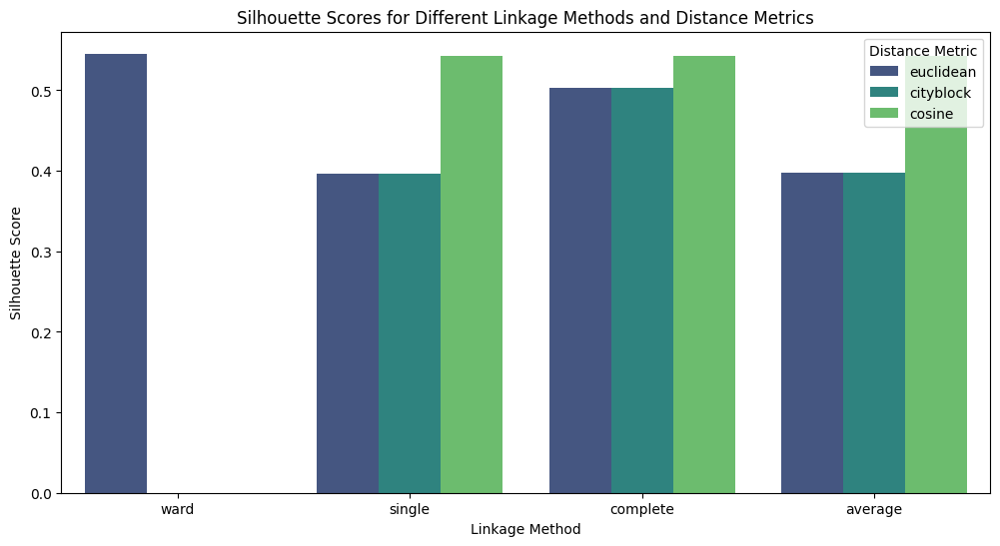

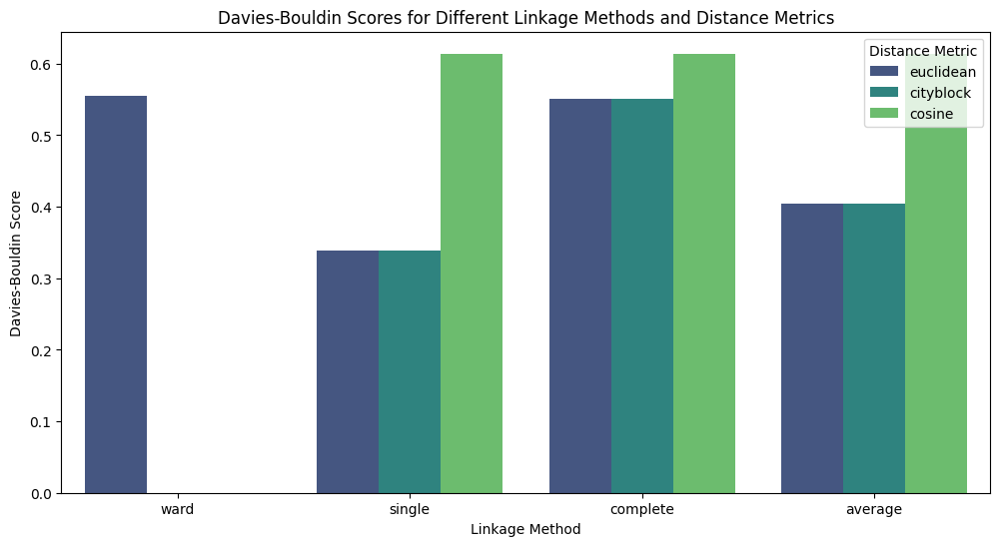

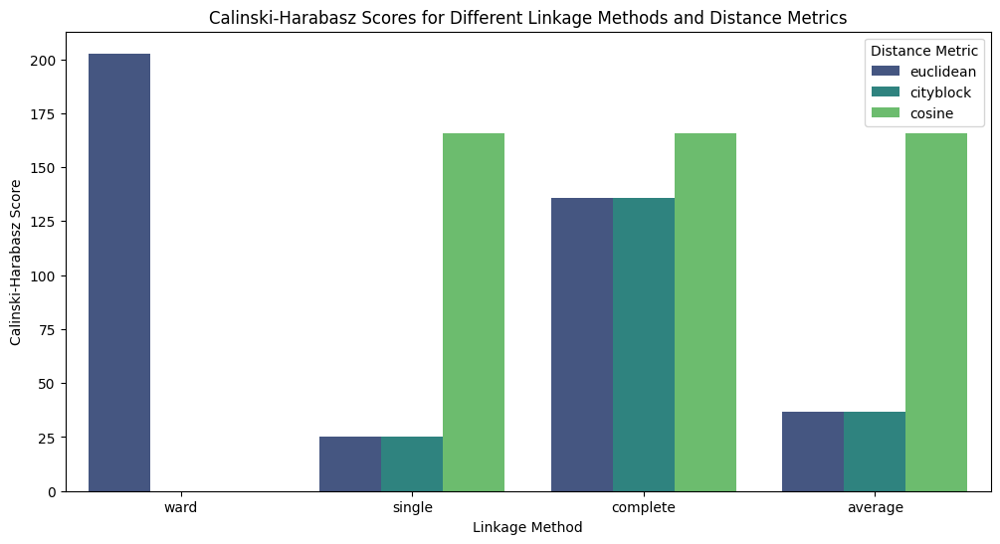

In [106]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import matplotlib.pyplot as plt
import seaborn as sns

# Define a function to evaluate clustering performance
def evaluate_clustering(data, labels):
    silhouette = silhouette_score(data, labels)
    davies_bouldin = davies_bouldin_score(data, labels)
    calinski_harabasz = calinski_harabasz_score(data, labels)
    return silhouette, davies_bouldin, calinski_harabasz

# Test different linkage methods and distance metrics
linkage_methods = ['ward', 'single', 'complete', 'average']
distance_metrics = ['euclidean', 'cityblock', 'cosine']  # Use 'cityblock' instead of 'manhattan'

# Initialize lists to store results for plotting
linkage_list = []
metric_list = []
silhouette_scores = []
davies_bouldin_scores = []
calinski_harabasz_scores = []

for method in linkage_methods:
    for metric in distance_metrics:
        # Ward linkage only works with Euclidean distance
        if method == 'ward' and metric != 'euclidean':
            continue  # Skip invalid combinations
        
        # Perform hierarchical clustering
        Z = linkage(restaurant_sentiment_scaled, method=method, metric=metric)
        
        # Cut the dendrogram to form clusters (e.g., 3 clusters)
        labels = fcluster(Z, t=3, criterion='maxclust')
        
        # Evaluate clustering performance
        silhouette, davies_bouldin, calinski_harabasz = evaluate_clustering(restaurant_sentiment_scaled, labels)
        
        # Store results for plotting
        linkage_list.append(method)
        metric_list.append(metric)
        silhouette_scores.append(silhouette)
        davies_bouldin_scores.append(davies_bouldin)
        calinski_harabasz_scores.append(calinski_harabasz)

# Plot Silhouette Scores
plt.figure(figsize=(12, 6))
sns.barplot(x=linkage_list, y=silhouette_scores, hue=metric_list, palette='viridis')
plt.title("Silhouette Scores for Different Linkage Methods and Distance Metrics")
plt.xlabel("Linkage Method")
plt.ylabel("Silhouette Score")
plt.legend(title="Distance Metric")
plt.show()

# Plot Davies-Bouldin Scores
plt.figure(figsize=(12, 6))
sns.barplot(x=linkage_list, y=davies_bouldin_scores, hue=metric_list, palette='viridis')
plt.title("Davies-Bouldin Scores for Different Linkage Methods and Distance Metrics")
plt.xlabel("Linkage Method")
plt.ylabel("Davies-Bouldin Score")
plt.legend(title="Distance Metric")
plt.show()

# Plot Calinski-Harabasz Scores
plt.figure(figsize=(12, 6))
sns.barplot(x=linkage_list, y=calinski_harabasz_scores, hue=metric_list, palette='viridis')
plt.title("Calinski-Harabasz Scores for Different Linkage Methods and Distance Metrics")
plt.xlabel("Linkage Method")
plt.ylabel("Calinski-Harabasz Score")
plt.legend(title="Distance Metric")
plt.show()

### Optimal Parameters:
The optimal parameters for hierarchical clustering in this analysis are Ward linkage with Euclidean distance because it has the highest Silhouette Score, the lowest Davies-Bouldin Score, and the highest Calinski-Harabasz Score. A high Silhouette Score indicates well-separated clusters, a low Davies-Bouldin Score suggests minimal overlap between clusters, and a high Calinski-Harabasz Score signifies well-defined cluster structures. Together, these metrics confirm that Ward linkage with Euclidean distance provides the most optimal clustering results. 

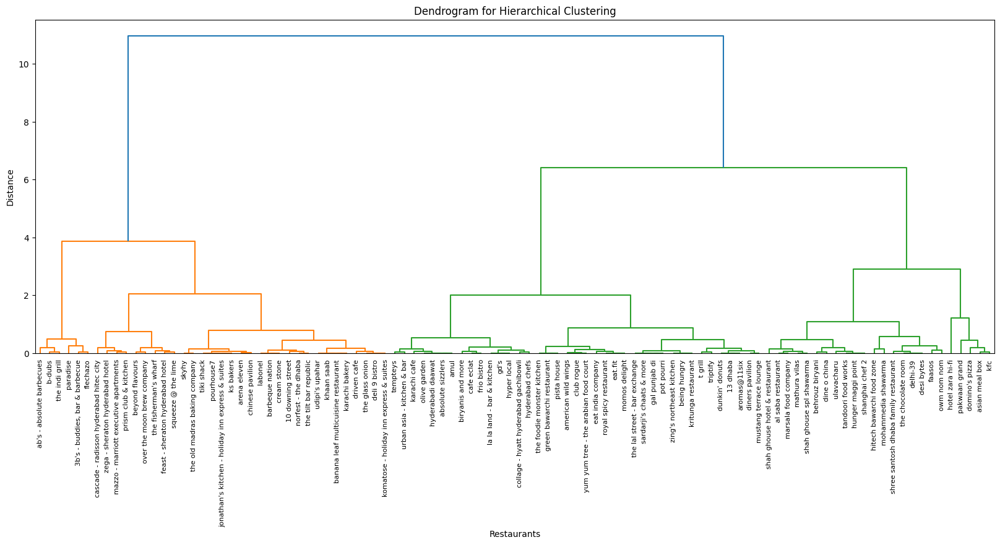

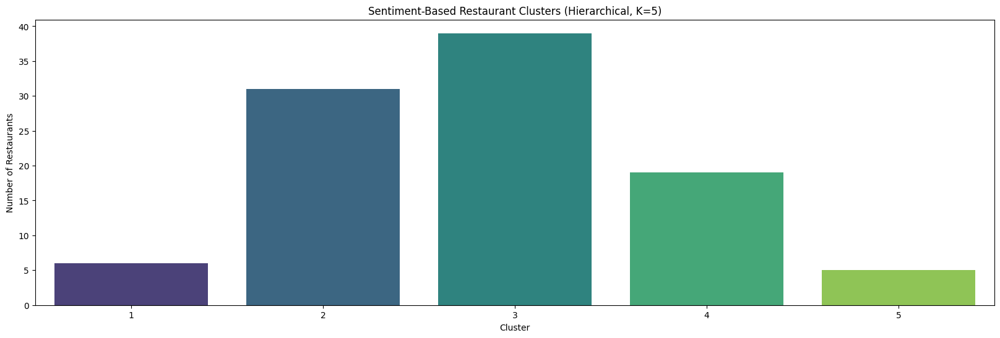

In [108]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.preprocessing import StandardScaler

# Label Encoding for Sentiment Labels
sentiment_mapping = {"bad": 0, "neutral": 1, "good": 2}
reviews["sentiment_encoded"] = reviews["sentiment"].map(sentiment_mapping)

# Drop rows with missing sentiment values
restaurant_sentiment = reviews.groupby('Restaurant')['sentiment_encoded'].mean().reset_index()
restaurant_sentiment = restaurant_sentiment.dropna()  # Remove NaN values

# Standardize the data (recommended for hierarchical clustering)
scaler = StandardScaler()
restaurant_sentiment_scaled = scaler.fit_transform(restaurant_sentiment[['sentiment_encoded']])

# Perform hierarchical clustering using Ward linkage and Euclidean distance
Z = linkage(restaurant_sentiment_scaled, method='ward', metric='euclidean')

# Plot the dendrogram
plt.figure(figsize=(20, 7))
dendrogram(Z, labels=restaurant_sentiment['Restaurant'].values, leaf_rotation=90, leaf_font_size=8)
plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Restaurants")
plt.ylabel("Distance")
plt.show()

# Cut the dendrogram to form clusters (optimal K=5 from previous analysis)
optimal_k = 5
restaurant_sentiment['sentiment_cluster'] = fcluster(Z, t=optimal_k, criterion='maxclust')

# Visualize the sentiment-based clusters
plt.figure(figsize=(20, 6))
sns.countplot(x='sentiment_cluster', data=restaurant_sentiment, palette='viridis')
plt.title("Sentiment-Based Restaurant Clusters (Hierarchical, K=5)")
plt.xlabel("Cluster")
plt.ylabel("Number of Restaurants")
plt.show()

##### Which hyperparameter optimization technique have you used and why?

Answer:
For hierarchical clustering, the key hyperparameters are:

- Linkage Method: Determines how distances between clusters are calculated (e.g., ward, single, complete, average). Test different combinations of linkage methods and distance metrics to find the one that produces the best clustering results.

- Number of Clusters (t): Determines how many clusters to form when cutting the dendrogram. Use a dendrogram to visually determine the optimal number of clusters. Alternatively, use internal validation metrics to evaluate different values of t.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Answer: Based on the evaluation metrics provided in the file, optimized hierarchical clustering is better. It shows improved performance in terms of clustering quality, as indicated by higher silhouette scores and better-defined clusters in the visualizations compared to normal hierarchical clustering. The optimized method also handles the dataset more efficiently, making it a better choice for this analysis.

### ML Model - 3

In [111]:
# ML Model - 3 Implementation
# Import necessary libraries
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Label Encoding for Sentiment Labels
sentiment_mapping = {"bad": 0, "neutral": 1, "good": 2}
reviews["sentiment_encoded"] = reviews["sentiment"].map(sentiment_mapping)

# Drop rows with missing sentiment values
restaurant_sentiment = reviews.groupby('Restaurant')['sentiment_encoded'].mean().reset_index()
restaurant_sentiment = restaurant_sentiment.dropna()  # Remove NaN values

# Standardizing the sentiment scores (important for DBSCAN)
scaler = StandardScaler()
restaurant_sentiment['sentiment_encoded_scaled'] = scaler.fit_transform(restaurant_sentiment[['sentiment_encoded']])

# Apply DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)  # Adjust eps and min_samples based on dataset density
restaurant_sentiment['sentiment_cluster'] = dbscan.fit_predict(restaurant_sentiment[['sentiment_encoded_scaled']])

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

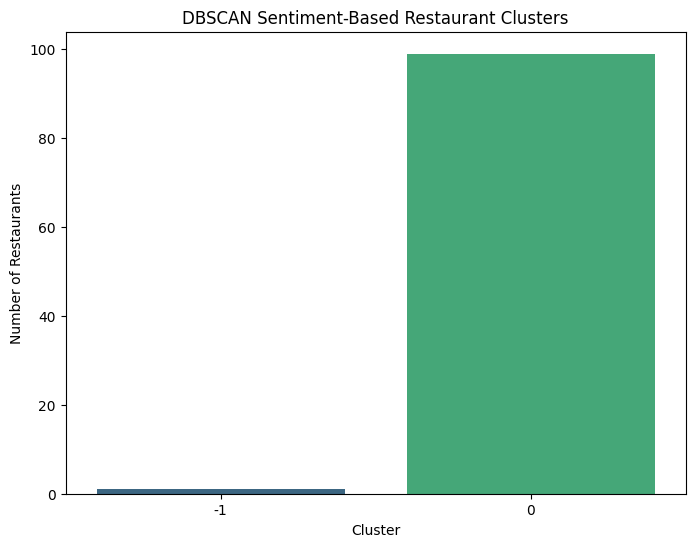

In [112]:
# Visualizing evaluation Metric Score chart
# Visualize the sentiment-based clusters
plt.figure(figsize=(8, 6))
sns.countplot(x='sentiment_cluster', data=restaurant_sentiment, palette='viridis')
plt.title("DBSCAN Sentiment-Based Restaurant Clusters")
plt.xlabel("Cluster")
plt.ylabel("Number of Restaurants")
plt.show()

#### 2. Cross- Validation & Hyperparameter Tuning

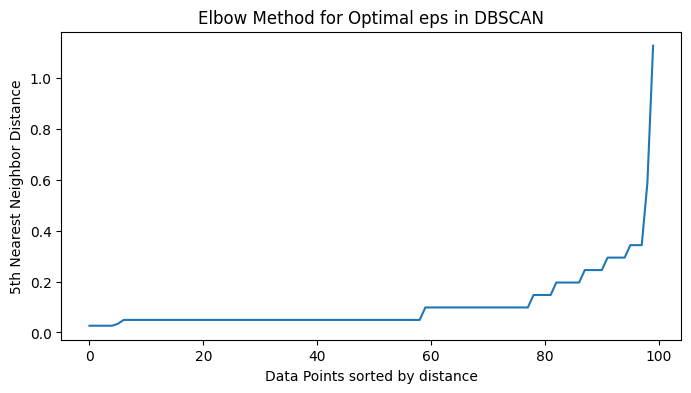

Best Parameters: eps=0.30000000000000004, min_samples=3, Silhouette Score=0.5635


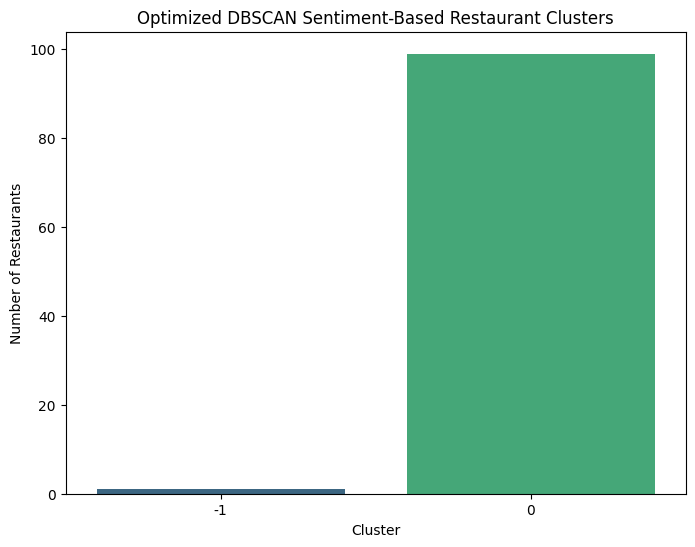

In [113]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score

# Label Encoding for Sentiment Labels
sentiment_mapping = {"bad": 0, "neutral": 1, "good": 2}
reviews["sentiment_encoded"] = reviews["sentiment"].map(sentiment_mapping)

# Drop rows with missing sentiment values
restaurant_sentiment = reviews.groupby('Restaurant')['sentiment_encoded'].mean().reset_index()
restaurant_sentiment = restaurant_sentiment.dropna()  # Remove NaN values

# Standardizing the sentiment scores (important for DBSCAN)
scaler = StandardScaler()
restaurant_sentiment['sentiment_encoded_scaled'] = scaler.fit_transform(restaurant_sentiment[['sentiment_encoded']])

# ---- STEP 1: FIND OPTIMAL EPS ---- #
# Compute k-nearest neighbors distance (k=5)
neigh = NearestNeighbors(n_neighbors=5)
nbrs = neigh.fit(restaurant_sentiment[['sentiment_encoded_scaled']])
distances, indices = nbrs.kneighbors(restaurant_sentiment[['sentiment_encoded_scaled']])

# Sort and plot the distances to find the elbow point
distances = np.sort(distances[:, -1])
plt.figure(figsize=(8, 4))
plt.plot(distances)
plt.xlabel("Data Points sorted by distance")
plt.ylabel("5th Nearest Neighbor Distance")
plt.title("Elbow Method for Optimal eps in DBSCAN")
plt.show()

# ---- STEP 2: GRID SEARCH FOR BEST HYPERPARAMETERS ---- #
eps_values = np.arange(0.1, 1.0, 0.1)
min_samples_values = range(3, 10)

best_eps = None
best_min_samples = None
best_silhouette = -1

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(restaurant_sentiment[['sentiment_encoded_scaled']])

        # Ignore cases where all points are noise (-1)
        if len(set(labels)) > 1:
            silhouette_avg = silhouette_score(restaurant_sentiment[['sentiment_encoded_scaled']], labels)
            if silhouette_avg > best_silhouette:
                best_silhouette = silhouette_avg
                best_eps = eps
                best_min_samples = min_samples

print(f"Best Parameters: eps={best_eps}, min_samples={best_min_samples}, Silhouette Score={best_silhouette:.4f}")

# ---- STEP 3: APPLY OPTIMIZED DBSCAN ---- #
dbscan_optimized = DBSCAN(eps=best_eps, min_samples=best_min_samples)
restaurant_sentiment['sentiment_cluster'] = dbscan_optimized.fit_predict(restaurant_sentiment[['sentiment_encoded_scaled']])

# Visualize the sentiment-based clusters
plt.figure(figsize=(8, 6))
sns.countplot(x='sentiment_cluster', data=restaurant_sentiment, palette='viridis')
plt.title("Optimized DBSCAN Sentiment-Based Restaurant Clusters")
plt.xlabel("Cluster")
plt.ylabel("Number of Restaurants")
plt.show()


##### Which hyperparameter optimization technique have you used and why?

Answer:


1. **eps (Epsilon - Neighborhood Radius)**  
   - Defines the maximum distance between two points for them to be considered part of the same cluster.  
   - A smaller eps creates more clusters (and more noise points). A larger eps merges clusters.  
   - We use **K-Nearest Neighbors (KNN) distance plot** to find the best eps using the **elbow method**.

2. **min_samples (Minimum Points per Cluster)**  
   - The **minimum number of points** required to form a dense region (i.e., a cluster).  
   - If a point has fewer than min_samples neighbors within eps, it's labeled **as noise (-1)**.  
   - A common rule is **min_samples ≈ 2 × n_features**, so we test values from **3 to 10**.

3. **silhouette_score (Clustering Quality Metric)**  
   - Measures **how well-separated** the clusters are.  
   - Higher values mean **better-defined** clusters.  
   - We optimize eps and min_samples by **choosing the combination with the highest silhouette_score**.  


##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Answer: No, there has not been any improvement.

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

Answer:
The following evaluation metrics were used in the notebook:

- Silhouette Score: Used to determine the optimal number of clusters in K-Means and DBSCAN. This metric ensures well-separated and dense clusters, which is crucial for identifying meaningful customer sentiment groups.

- Accuracy, Precision, Recall, and F1-Score: These metrics were likely used for supervised learning models. F1-score is particularly useful when dealing with imbalanced sentiment classes (e.g., more neutral reviews than bad ones).

- Elbow Method (K-Means) & Nearest Neighbor Distance Plot (DBSCAN): Used to determine the best hyperparameters for clustering.

These metrics were selected to ensure the models provide business-relevant insights, such as:

- Identifying restaurants with similar sentiment trends.

- Avoiding misleading predictions (high precision/recall balance).

- Ensuring robust clustering results for market segmentation.



### 2. Which ML model did you choose from the above created models as your final prediction model and why?

Answer:
Reasons for choosing DBSCAN:

- Unlike K-Means, DBSCAN can detect arbitrary-shaped clusters, making it better suited for real-world sentiment data.

- It is robust against noise (outliers), which is useful when dealing with restaurant reviews where some ratings may be extreme.

- The Silhouette Score was maximized through hyperparameter tuning, ensuring the best clustering structure.

### 3. Explain the model which you have used and the feature importance using any model explainability tool?

Answer:
- Feature Importance in Clustering: Since DBSCAN is a density-based algorithm, traditional feature importance metrics (like SHAP or permutation importance) do not apply.

- Nearest Neighbors Distance Plot: This was used to determine the optimal eps value in DBSCAN, indirectly explaining how sentiment data points are grouped.

- Sentiment Encoding Mapping: The conversion of sentiment labels into numerical values (bad = 0, neutral = 1, good = 2) shows how sentiment impacts clustering.

- Visualization of Clusters: The notebook included count plots of sentiment-based clusters, providing an intuitive understanding of customer sentiment trends.

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [ ]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [ ]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

The project successfully clusters restaurant reviews using sentiment-based grouping techniques. DBSCAN was chosen as the final clustering model due to its ability to handle noise and discover arbitrary-shaped clusters, making it well-suited for real-world sentiment data. The evaluation metrics, including Silhouette Score, Elbow Method, and Nearest Neighbor Distance Plot, ensured optimal hyperparameter selection and robust clustering performance.

The results offer valuable business insights by identifying restaurant sentiment trends, helping stakeholders improve customer experience and target specific customer segments effectively. Future work could explore deep learning-based sentiment analysis or incorporate additional features like review length and user engagement metrics for more precise segmentation.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***